In [1]:
intro_images_path='./Images/Intro_images/'
edge_images_path='./Images/Edge_images/'
#seg_images_path='./Images/Seg_images/'
feature_images_path='./Images/Feature_images/'
output_images_path='./Images/Output_images/'
print('Image paths ....')

Image paths ....


# Visión por Computador

**Grao en Intelixencia Artificial**

Curso 2025-26


<img src="./Logotipo_Solo.png" width=200/>


## 2 Procesamento de imaxes e bordos

- Operacións aritméticas e lóxicas
- Ecualización de histogramas
- Convolución
- Correlación
- Pirámides de imaxes
- Coincidencia de modelos
- Gradientes de imaxe
- Efecto de ruído e suavizado
- Derivada do filtro gaussiano
- Detector de bordos Canny
- Lapaciano
- Transformada de Hough

http://szeliski.org/Book/

## Manipulación fotométrica

* Aprenderás a cambiar a aparencia dunha imaxe cambiando o valor dun píxel da imaxe. Podemos usar estas operacións para cambiar as propiedades fotométricas da imaxe, como o brillo, o contraste e a cor.

* Repasaremos o código que implementa as operacións cos píxeles. Aprenderás a programar en Python para manipular a cor e o contraste.

* Aprenderás sobre un método estándar de axuste de contraste chamado ecualización do histograma. Primeiro, aprenderás sobre un histograma; despois, verás as matemáticas detrás das ideas, seguidas dun algoritmo detrás do concepto. Por último, verémolo implementado no código.

## Operacións con píxeles

O **operador de procesamento de imaxes**, $h$, é unha función que toma unha imaxe de entrada $f(i, j)$ e produce unha imaxe de saída $g(i, j)$: $g(i, j) = h (f(i, j))$
      

Algunhas transformacións comúns

1. **Modulación de contraste e brillo**: $g(i, j) = a f(i, j) + b$, onde $a$ se chama *ganancia* con $a > 0$ e $b$ se chama nesgo.

2. **Filtro de densidade graduada**: $g(i, j) = a(i, j) f(i, j) + b (i, j)$, onde a ganancia e o nesgo varían espacialmente. 
    
3. **Operador de mestura lineal**: úsase para realizar unha mestura entre dúas imaxes ou vídeos.

     \begin{equation}
            g(i, j) = (1 - \alpha) f_0 (i, j) + \alpha f_1 (i, j)
      \end{equation}
  
      Ao variar $\alpha$ de 0 a 1, a mestura cambia gradualmente.
      
4. **Corrección gamma**: ás veces úsase para eliminar a correspondencia non lineal entre a radiancia de entrada e os valores de píxeles cuantizados.

   \begin{equation}
   g(i, j) = [f(i, j)]^\frac{1}{\gamma}
   \end{equation}

    Un valor gamma de 2,2 axústase ben á maioría das cámaras dixitais.

In [2]:
# pip install scikit-image

Text(0.5, 1.0, 'Imaxe con Gamma corrixido')

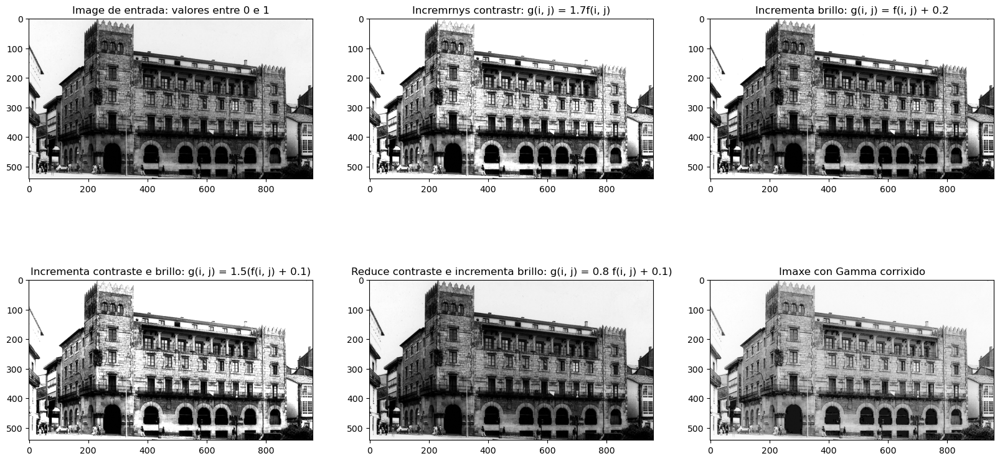

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from skimage import io  #has functions to read and write images
from skimage import color as change # contains function to change between color spaces

import cv2  # OpenCV - https://opencv.org/

np.set_printoptions(precision=2)

def change_contrast (input_im, a) :
# Note this function will work for the case when a is a constant and also when
# a is an array with spatially variant values over the image locations
# Assumes the image pixel values range between 0 and 1.
    out_im = a * input_im  # This is NOT matrix multiply when a is a matrix. It is elementwise multiplication.
    out_im = np.where(out_im > 1, 1, out_im) # clip the intensity to max 1
    out_im = np.where(out_im < 0, 0, out_im) # clip the intensity to min 0
    return (out_im)

def change_brightness(input_im, b) :
    out_im = input_im + b
    out_im = np.where(out_im > 1, 1, out_im) # clip the intensity to max 1
    out_im = np.where(out_im < 0, 0, out_im) # clip the intensity to min 0
    return (out_im)

def linear_blend (input_im1, input_im2, alpha) :
    return ((1-alpha)*input_im1 + alpha * input_im2)

def gamma_correction (input_im, gamma) :
    return (np.power(input_im, 1/gamma))


#----------------------------------------------------------------------------------
# Load an color image in grayscale
img = io.imread(edge_images_path+'hotel.jpg',1)
#img = change.rgb2gray(change.rgba2rgb(img))


img = img.astype(float)  # need to change type from uint8 to float

#--------------------Display functions----------------------------------------
fig, axs = plt.subplots(2, 3)
fig.set_size_inches (20, 10)
axs[0,0].imshow(img, 'gray');
axs[0,0].set_title('Image de entrada: valores entre 0 e 1')

axs[0,1].imshow(change_contrast(img, 1.7), 'gray');
axs[0,1].set_title('Incremrnys contrastr: g(i, j) = 1.7f(i, j)')

axs[0,2].imshow(change_brightness(img, 0.2), 'gray');
axs[0,2].set_title('Incrementa brillo: g(i, j) = f(i, j) + 0.2')

axs[1,0].imshow(change_contrast(change_brightness(img, 0.1), 1.5), 'gray');
axs[1,0].set_title('Incrementa contraste e brillo: g(i, j) = 1.5(f(i, j) + 0.1)')

axs[1,1].imshow(change_brightness(change_contrast(img, 0.8), 0.1), 'gray');
axs[1,1].set_title('Reduce contraste e incrementa brillo: g(i, j) = 0.8 f(i, j) + 0.1)')

axs[1,2].imshow(gamma_correction(img, 2.2), 'gray');
axs[1,2].set_title('Imaxe con Gamma corrixido')


### Manipulación de brillo e contraste da cor

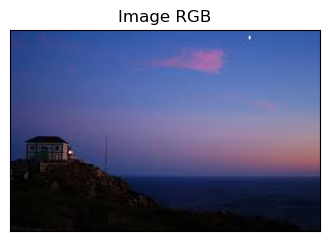

Intensidade máxima na imaxe: 1.0 tipo pixel float64 dimensións: (181, 279, 3)


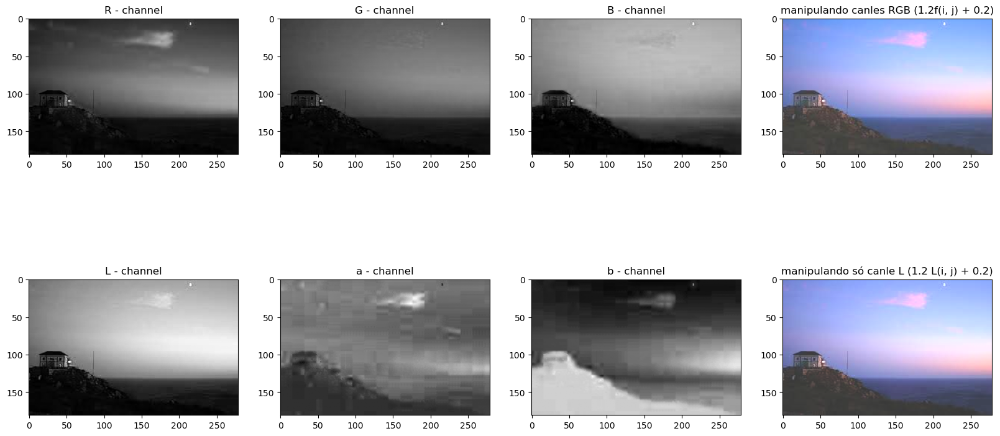

In [4]:
import matplotlib.pyplot as plt


in_im = io.imread(intro_images_path + 'fisterra.jpg')
in_im = in_im.astype(float)
in_im /= np.max(in_im) # scales pixel values to be between 0 and 1

plt.figure(figsize= (4,3))
plt.imshow(in_im)
plt.title('Image RGB')
plt.xticks([]), plt.yticks([])
plt.show()

print('Intensidade máxima na imaxe:', np.max(in_im), 'tipo pixel', in_im.dtype, 'dimensións:', in_im.shape)
# NOTE: Some color images are stored in RGBA format involving 4 channels. The 4th channel represents
# the alpha value is between 0 and 1, where 0 is fully transparent and 1 is fully opaque.
# We will ignore this fourth channel if it exists


fig, axs = plt.subplots(2, 4)
fig.set_size_inches (20,10)

axs[0,0].imshow(in_im[:,:,0], 'gray'); axs[0,0].set_title('R - channel')
axs[0,1].imshow(in_im[:,:,1], 'gray'); axs[0,1].set_title('G - channel')
axs[0,2].imshow(in_im[:,:,2], 'gray'); axs[0,2].set_title('B - channel')


# Modify the RGB channels individually
out_im_rgb = np.zeros((in_im.shape[0], in_im.shape[1], 3))
out_im_rgb[:,:,0] = change_contrast(change_brightness(in_im[:,:,0], 0.2), 1.2);
out_im_rgb[:,:,1] = change_contrast(change_brightness(in_im[:,:,1], 0.2), 1.2);
out_im_rgb[:,:,2] = change_contrast(change_brightness(in_im[:,:,2], 0.2), 1.2);

axs[0,3].imshow(out_im_rgb); axs[0,3].set_title ('manipulando canles RGB (1.2f(i, j) + 0.2)');

# Modify the L channel of Lab space
out_im_Lab = change.rgb2lab(in_im)
# manipulate the L channel. - L ranges between 0 and 100
out_im_Lab[:,:,0] = change_contrast(change_brightness(out_im_Lab[:,:,0]/100, 0.2), 1.2) * 100.0
out_im_rgb = change.lab2rgb(out_im_Lab)

axs[1,0].imshow(out_im_Lab[:,:,0], 'gray'); axs[1,0].set_title('L - channel')
axs[1,1].imshow(out_im_Lab[:,:,1], 'gray'); axs[1,1].set_title('a - channel')
axs[1,2].imshow(out_im_Lab[:,:,2], 'gray'); axs[1,2].set_title('b - channel')
axs[1,3].imshow(out_im_rgb); axs[1,3].set_title('manipulando só canle L (1.2 L(i, j) + 0.2)');

### Operacións de normalización de imaxes para aprendizaxe profunda

* Dividir cada píxel da imaxe de entrada, $f(i,j)$, polo valor máximo posible dun píxel, 255, de xeito que os valores RGB de cada píxel estean entre 0 e 1. Chamémoslle a esta imaxe $f_{norm}$.

* Calcular a media e a desviación estándar de todos os píxeles da imaxe, $f_{norm}$. Restar o valor medio de cada píxel e dividir a desviación estándar. Chamémoslle a esta imaxe $f_{std}$.

>> Ás veces utilízanse valores medios e de desviación estándar do coñecido conxunto de datos ImageNet. Valores de ImageNet: MEAN = np.array([0.485, 0.456, 0.406]); STD = np.array([0.229, 0.224, 0.225])

* A imaxe resultante ten valores de píxeles que poden ser negativos.

* Engade 3 á imaxe resultante, $f_{std}$, e divide entre 6 para reescalar o valor do píxel entre 0 e 1. Recorta os valores dos píxeles fóra de 0 e 1.

* Esta transformación aliña a media e as desviacións estándar dos canais de cor e axuda a acelerar a converxencia dos métodos de aprendizaxe profunda.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7781538432102435..4.032237480835427].


Mean:  [0.27 0.29 0.46] Std:  [0.18 0.17 0.26]
Image (min, max) intensity: -1.7781538432102435 4.032237480835427 pixel type float64 dimensions: (181, 279, 3)


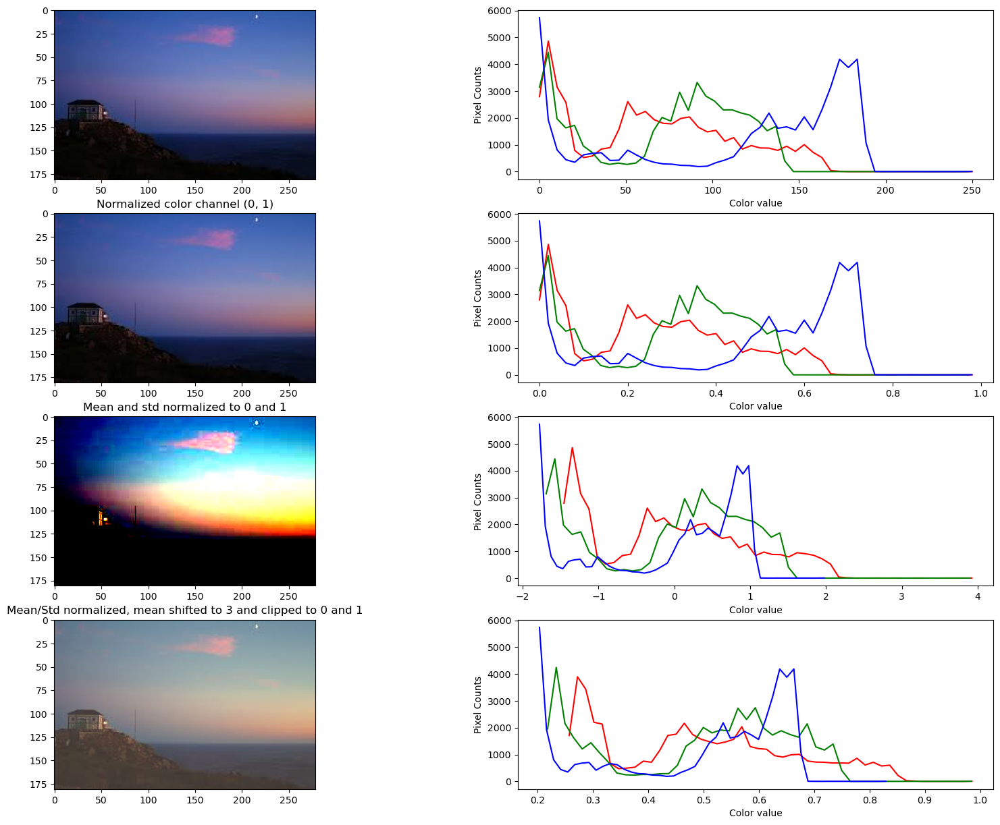

In [5]:
def draw_color_histogram (image, axs) :
    histogram, bin_edges = np.histogram(image[:, :, 0], bins=50)
    axs.plot(bin_edges[0:-1], histogram, color="red")

    histogram, bin_edges = np.histogram(image[:, :, 1], bins=50)
    axs.plot(bin_edges[0:-1], histogram, color="green")

    histogram, bin_edges = np.histogram(image[:, :, 2], bins=50)
    axs.plot(bin_edges[0:-1], histogram, color="blue")

    axs.set_xlabel("Color value")
    axs.set_ylabel("Pixel Counts")



fig, axs = plt.subplots(4, 2)
fig.set_size_inches (20, 15)

in_im = io.imread(intro_images_path + 'fisterra.jpg')

axs[0,0].imshow(in_im)
draw_color_histogram (in_im, axs[0,1])

# -----------------------------------normalize the range to 0 and 1-----------------------------------
in_im = in_im.astype(float)
in_im_norm = in_im/np.max(in_im) # scales pixel values to be between 0 and 1

axs[1,0].imshow(in_im_norm)
axs[1,0].set_title('Normalized color channel (0, 1)')
draw_color_histogram (in_im_norm, axs[1,1])

# -----------------------------------normalize the values to have zero mean and unit variance ----------------------
mean = np.mean(in_im_norm, axis=(0,1))
std = np.std(in_im_norm, axis=(0,1))
print('Mean: ', mean, 'Std: ', std)
# Imagenet values
# MEAN = np.array([0.485, 0.456, 0.406])
# STD = np.array([0.229, 0.224, 0.225])

in_im_std = (in_im_norm - mean[None, None, :])/std[None, None, :]

print('Image (min, max) intensity:', np.min(in_im_std), np.max(in_im_std), 'pixel type', in_im_std.dtype, 'dimensions:', in_im_std.shape)
axs[2,0].imshow(in_im_std)
axs[2,0].set_title ('Mean and std normalized to 0 and 1')
draw_color_histogram (in_im_std, axs[2,1])
#----------------------------------- rescale values to be between 0 and 1 -----------------------------------
in_im_std_clipped = (in_im_std + 3)/6
in_im_std_clipped = np.where(in_im_std_clipped > 1, 1, in_im_std_clipped)
in_im_std_clipped = np.where(in_im_std_clipped < 0, 0, in_im_std_clipped)

axs[3,0].imshow(in_im_std_clipped);
axs[3,0].set_title ('Mean/Std normalized, mean shifted to 3 and clipped to 0 and 1')
draw_color_histogram (in_im_std_clipped, axs[3,1])



### Diferenza de Imaxes

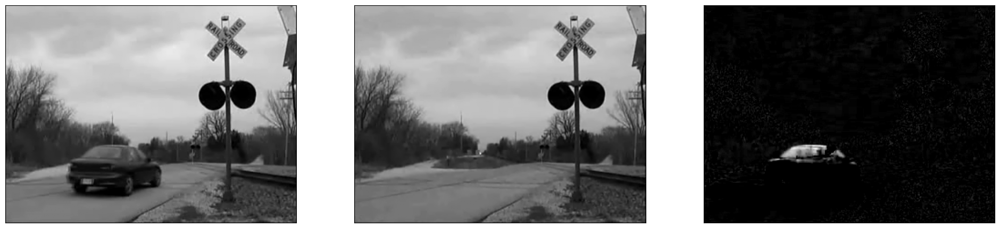

In [6]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt

bg = cv2.imread(intro_images_path+'background.png',0)
fg = cv2.imread(intro_images_path+'foreground.png',0)

motion =np.absolute(cv2.subtract(fg,bg))

plt.figure(figsize= (0.1*bg.shape[0],0.1*bg.shape[1]))
plt.subplot(131), plt.imshow(fg, 'gray')
plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(bg,'gray')
plt.xticks([]), plt.yticks([])
plt.subplot(133), plt.imshow(motion, 'gray')
plt.xticks([]), plt.yticks([])
plt.show()

### Ecualización de Histogramas en OpenCV

https://docs.opencv.org/3.4.2/d5/daf/tutorial_py_histogram_equalization.html

OpenCV ten unha función para facelo, cv2.equalizeHist(). A súa entrada é simplemente unha imaxe en escala de grises e a saída é a imaxe ecualizada con histograma. Podes tomar diferentes imaxes con diferentes condicións de luz, ecualizalas e comprobar os resultados.

A ecualización do histograma é boa cando o histograma dunha imaxe está confinado a unha rexión particular. Non funciona en imaxes onde hai píxeles brillantes e escuros. Neses casos, unha ecualización adaptativa é máis cómoda.

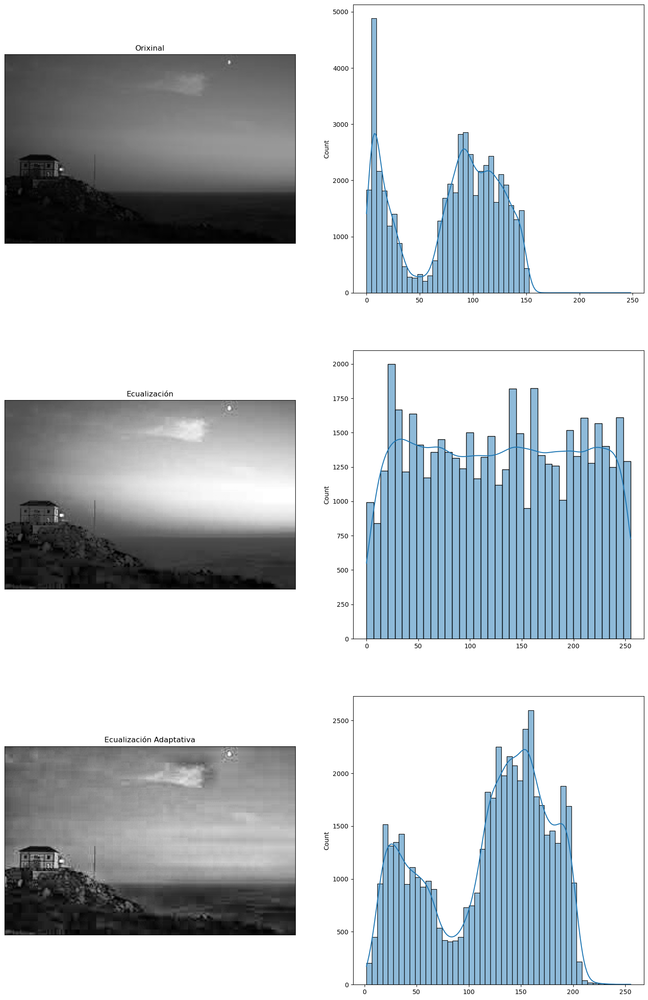

In [7]:
import seaborn as sns

img = cv2.imread(intro_images_path+'fisterra_gray.jpg',0)
equ = cv2.equalizeHist(img)
#res = np.hstack((img,equ)) #stacking images side-by-side
#cv2.imwrite('fisterra_gray_eq.png',res)

plt.figure(figsize= (0.1*img.shape[0],0.1*img.shape[1]))

plt.subplot(321), plt.imshow(img, 'gray')
plt.xticks([]), plt.yticks([])
plt.title('Orixinal')
#hist = cv2.calcHist([img],[0],None,[256],[0,256])
#hist_norm=100*hist/img.size
plt.subplot(322), sns.histplot(img.reshape(-1), kde=True) #plt.plot(hist_norm)


plt.subplot(323), plt.imshow(equ,'gray')
plt.xticks([]), plt.yticks([])
plt.title('Ecualización')
#hist = cv2.calcHist([equ],[0],None,[256],[0,256])
#hist_norm=100*hist/equ.size
plt.subplot(324), sns.histplot(equ.reshape(-1), kde=True) #plt.plot(hist_norm)


#Adaptive histogram equalization
clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(16,16))
cl1 = clahe.apply(img)
plt.subplot(325), plt.imshow(cl1,'gray')
plt.xticks([]), plt.yticks([])
plt.title('Ecualización Adaptativa')

#hist = cv2.calcHist([cl1],[0],None,[256],[0,256])
#hist_norm=100*hist/cl1.size
plt.subplot(326), sns.histplot(cl1.reshape(-1), kde=True)# plt.plot(hist_norm)

plt.show()


## Convolución e Correlación

Aquí aprenderemos:

* Diferentes aspectos do filtrado lineal: correlación, convolucións, funcións escalonadas, filtro gaussiano, escala, a primeira derivada dunha gaussiana, a segunda derivada dunha gaussiana e a diferenza de gaussianas.

* Propiedades matemáticas das convolucións, concretamente linealidade, invariante de desprazamento, propiedade conmutativa e operación de diferenciación. Estas operacións simplifican a implementación informática da convolución.

* Representación matemática das arestas de intensidade en termos de funcións escalonadas e o seu filtrado lineal con derivadas gaussianas.

* Como aproximar filtros de derivadas gaussianas con versións máis eficientes computacionalmente, concretamente a diferenza de gaussiana, o laplaciano de gaussiana e as convolucións repetidas.

### Filtrado de correlación

* A versión de filtrado máis común é a suma ponderada dos píxeles veciños. Esta operación chámase **correlación** (tamén coñecida como **correlación cruzada** no procesamento de sinais), dada por:

$$
g(i,j) = f \otimes h = \sum_{k} \sum_{l} h(k, l) f(i+k, j+l)
$$

* A función $h(i,j)$ chámase filtro, máscara ou núcleo.

* Coloca o filtro nunha localización, multiplica e despois suma para obter o valor.

* De xeito equivalente, despraza a imaxe, mantendo o filtro fixo, e despois multiplica e suma. Non obstante, debes prestar atención aos signos dos índices.

$$
\begin{aligned}
g(i,j) &= f \otimes h = \sum_{k} \sum_{l} h(k, l) f(i+k, j+l) \\
       &= \sum_{r} \sum_{s} h(r-i, s-j) f(r, s) \quad \text{substituíndo } r = i+k, s = j+l
\end{aligned}
$$

In [8]:
import numpy as np
h = np.array([[-1, 0, 1],[-1, 0, 0],[-1, 0, 1]])
f = np.zeros((10,10))
f[3:8,3:8] = np.ones((5, 5)) #block assignment of values

print("Image f=\n", f, "\nFilter/Kernel h=\n", h)


def cross_correlation2d(f, h):
    """
    Compute the cross-correlation between a 2D matrix f and a 2D kernel h.
    
    Parameters:
    - f: 2D numpy array (input image/matrix)
    - h: 2D numpy array (kernel)
    
    Returns:
    - result: 2D numpy array (cross-correlated output)
    """
    fh, fw = f.shape
    kh, kw = h.shape
    pad_h = kh // 2
    pad_w = kw // 2

    # Pad the input matrix with zeros on the border
    f_padded = np.pad(f, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')

    # Initialize output matrix
    result = np.zeros_like(f)

    # Perform cross-correlation
    for i in range(fh):
        for j in range(fw):
            region = f_padded[i:i+kh, j:j+kw]
            result[i, j] = np.sum(region * h)
    
    return result

print("Output computed by moving the h over f=\n",cross_correlation2d(f,h))

Image f=
 [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]] 
Filter/Kernel h=
 [[-1  0  1]
 [-1  0  0]
 [-1  0  1]]
Output computed by moving the h over f=
 [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  1.  0.  0.  0. -1. -1.  0.]
 [ 0.  0.  1.  1. -1. -1. -1. -2. -2.  0.]
 [ 0.  0.  2.  2. -1. -1. -1. -3. -3.  0.]
 [ 0.  0.  2.  2. -1. -1. -1. -3. -3.  0.]
 [ 0.  0.  2.  2. -1. -1. -1. -3. -3.  0.]
 [ 0.  0.  1.  1. -1. -1. -1. -2. -2.  0.]
 [ 0.  0.  1.  1.  0.  0.  0. -1. -1.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]]


### Exercicio: Correspondencia de modelos
https://docs.opencv.org/3.4.2/d4/dc6/tutorial_py_template_matching.html

A correspondencia de modelos é un método para buscar e atopar a localización dunha imaxe modelo nunha imaxe máis grande. OpenCV inclúe unha función cv2.matchTemplate() para este propósito. Simplemente desliza a imaxe modelo (T) sobre a imaxe de entrada (I), como na correlación 2D, e compara o modelo con cada parche da imaxe de entrada para obter a imaxe (R). OpenCV implementa varios métodos de comparación. Estes devolven unha imaxe en escala de grises (R), onde cada píxel indica canto coincide a veciñanza dese píxel co modelo.

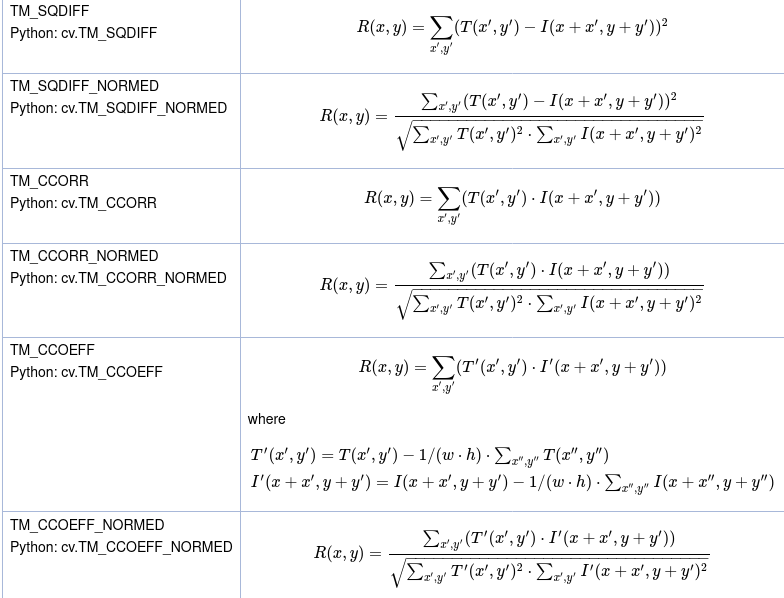

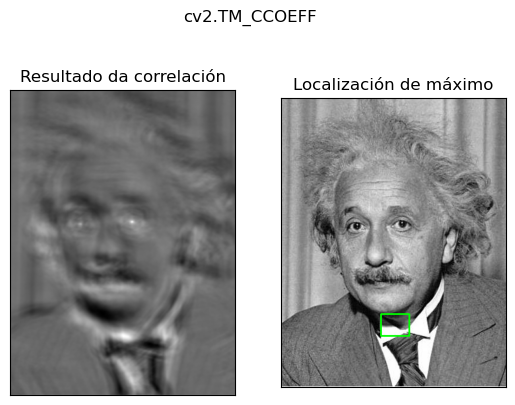

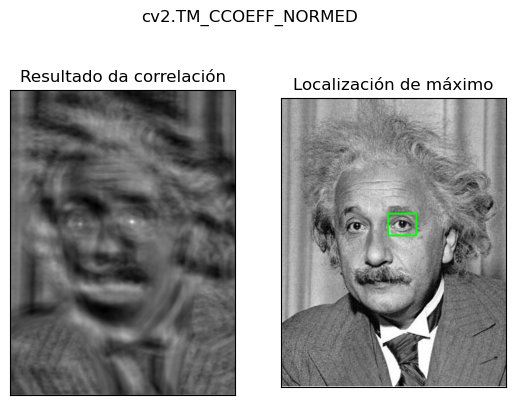

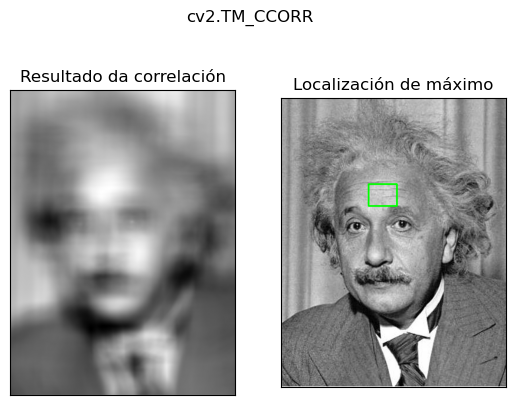

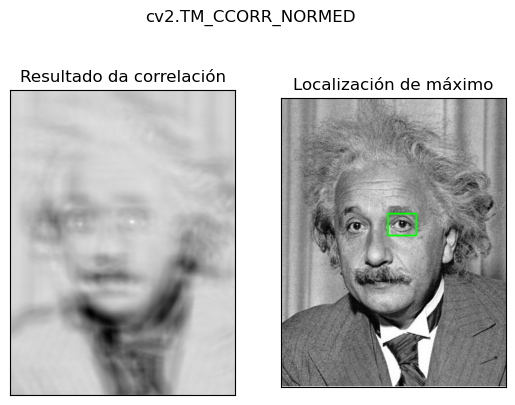

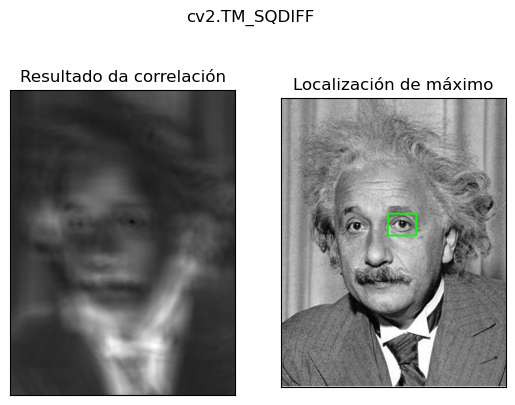

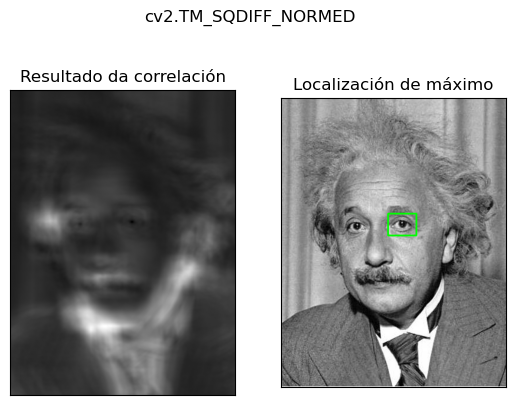

In [9]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread(intro_images_path+'einstein.jpg',0)
img2 = img.copy()
template = cv2.imread(intro_images_path+'einstein_eye.jpg',0)
w, h = template.shape[::-1]

# All the 6 methods for comparison in a list
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)

    # Apply template Matching
    res = cv2.matchTemplate(img,template,method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
        bottom_right = (top_left[0] + w, top_left[1] + h)

    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    cv2.rectangle(img,top_left, bottom_right, [0,255,0], 2)

    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Resultado da correlación'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img,cmap = 'gray')
    plt.title('Localización de máximo'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)
    plt.show()
    if method in [cv2.TM_CCOEFF_NORMED]:
        res=(res-min_val)/(max_val-min_val)*255
        cv2.imwrite(output_images_path+'einstein_ccoeff_normed.jpg',res)

## Convolución

* A operación **convolución** inverte a máscara do filtro arredor da orixe antes de realizar as operación de multiplicación e suma entre máscara e parte solapada da imaxe de entrada. O "inverter" é arredor da "orixe" da máscara. 

* O inverter non afecta aos núcleos con simetría circular, polo que a convolución é o mesmo que unha correlación para núcleos simétricos.

* Matematicamente, a operación de convolución ven dada por

$$
\begin{aligned}
f \star h &= \sum_{k, l} h(k, l) f(i - k, j - l) \\
          &= \sum_{r, s} h(i - r, j - s) f(r, s) \quad \text{substituíndo } r = i-k, s = j-l \\
          &= h \star f
\end{aligned}
$$


Imaxe f=
 [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]] 
Filtro/Kernel h=
 [[-1  0  1]
 [-1  0  0]
 [-1  0  1]]


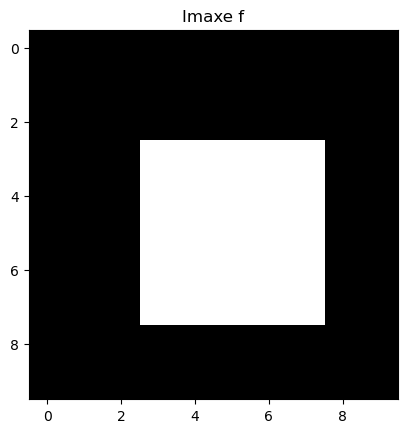

Saída calculada desprazando h sobre f=
 [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0. -1. -1.  0.  0.  0.  1.  1.  0.]
 [ 0.  0. -2. -2. -1. -1. -1.  1.  1.  0.]
 [ 0.  0. -3. -3. -1. -1. -1.  2.  2.  0.]
 [ 0.  0. -3. -3. -1. -1. -1.  2.  2.  0.]
 [ 0.  0. -3. -3. -1. -1. -1.  2.  2.  0.]
 [ 0.  0. -2. -2. -1. -1. -1.  1.  1.  0.]
 [ 0.  0. -1. -1.  0.  0.  0.  1.  1.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]]


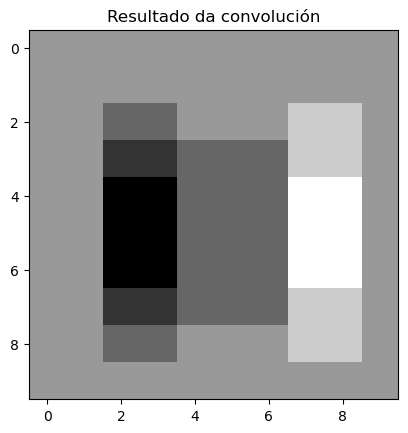

In [10]:
h = np.array([[-1, 0, 1],[-1, 0, 0],[-1, 0, 1]])
f = np.zeros((10,10))
f[3:8,3:8] = np.ones((5, 5)) #block assignment of values

print("Imaxe f=\n", f, "\nFiltro/Kernel h=\n", h)

plt.imshow(f, 'gray')
plt.title('Imaxe f')
plt.show()

def convolution2d(f, h):
    """
    Realiza a convolución entre unha matriz 2D f e un kernel 2D h.

    Parámetros:
    - f: numpy array 2D (imaxe ou matriz de entrada)
    - h: numpy array 2D (kernel ou filtro)

    Retorna:
    - result: numpy array 2D (matriz resultado da convolución)
    """
    fh, fw = f.shape
    kh, kw = h.shape
    pad_h = kh // 2
    pad_w = kw // 2

    # Rotar o kernel 180 grados
    h_flipped = np.flip(np.flip(h, axis=0), axis=1)

    # Padding da matriz de entrada, para obter unha saída do tamaño da entrada
    f_padded = np.pad(f, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')

    # Matriz de salida
    result = np.zeros_like(f)

    # Realizar la convolución
    for i in range(fh):
        for j in range(fw):
            region = f_padded[i:i+kh, j:j+kw]
            result[i, j] = np.sum(region * h_flipped)
            
    plt.imshow(result, 'gray')
    plt.title('Resultado da convolución')
    
    return result

print("Saída calculada desprazando h sobre f=\n",convolution2d(f,h))

### Comproba que se h é simétrica os resultados de convolución e correlación son idénticos

Imaxe f=
 [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]] 
Filtro/Kernel h con simetria radial=
 [[-1  2  1]
 [ 2  3  2]
 [ 1  2 -1]]


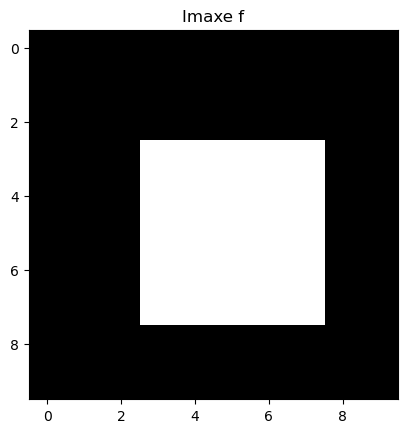

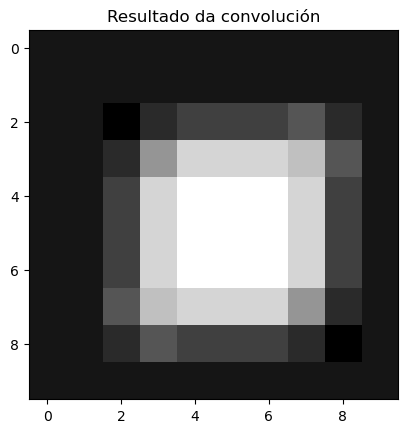

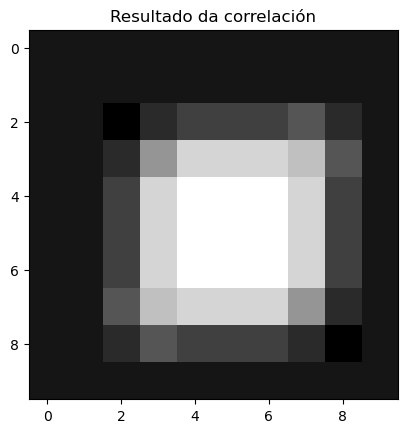

Saída calculada desprazando h sobre f=
 [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0. -1.  1.  2.  2.  2.  3.  1.  0.]
 [ 0.  0.  1.  6.  9.  9.  9.  8.  3.  0.]
 [ 0.  0.  2.  9. 11. 11. 11.  9.  2.  0.]
 [ 0.  0.  2.  9. 11. 11. 11.  9.  2.  0.]
 [ 0.  0.  2.  9. 11. 11. 11.  9.  2.  0.]
 [ 0.  0.  3.  8.  9.  9.  9.  6.  1.  0.]
 [ 0.  0.  1.  3.  2.  2.  2.  1. -1.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]]


In [11]:
h = np.array([[-1, 2, 1],[2, 3, 2],[1, 2, -1]])
f = np.zeros((10,10))
f[3:8,3:8] = np.ones((5, 5)) #block assignment of values

print("Imaxe f=\n", f, "\nFiltro/Kernel h con simetria radial=\n", h)

plt.imshow(f, 'gray')
plt.title('Imaxe f')
plt.show()

def convolution2d(f, h):
    """
    Realiza a convolución entre unha matriz 2D f e un kernel 2D h.

    Parámetros:
    - f: numpy array 2D (imaxe ou matriz de entrada)
    - h: numpy array 2D (kernel ou filtro)

    Retorna:
    - result: numpy array 2D (matriz resultado da convolución)
    """
    fh, fw = f.shape
    kh, kw = h.shape
    pad_h = kh // 2
    pad_w = kw // 2

    # Rotar o kernel 180 grados
    h_flipped = np.flip(np.flip(h, axis=0), axis=1)

    # Padding da matriz de entrada, para obter unha saída do tamaño da entrada
    f_padded = np.pad(f, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')

    # Matriz de salida
    result = np.zeros_like(f)

    # Realizar la convolución
    for i in range(fh):
        for j in range(fw):
            region = f_padded[i:i+kh, j:j+kw]
            result[i, j] = np.sum(region * h_flipped)
            
    result_corr = np.zeros_like(f)
            
    #realizar la correlación
    for i in range(fh):
        for j in range(fw):
            region = f_padded[i:i+kh, j:j+kw]
            result_corr[i, j] = np.sum(region * h)
            
    plt.imshow(result, 'gray')
    plt.title('Resultado da convolución')
    plt.show()
    
    plt.imshow(result_corr, 'gray')
    plt.title('Resultado da correlación')
    plt.show()
    
    return result

print("Saída calculada desprazando h sobre f=\n",convolution2d(f,h))

#### Moitas bibliotecas xa propocionan funcións para levar a cabo estas operacións

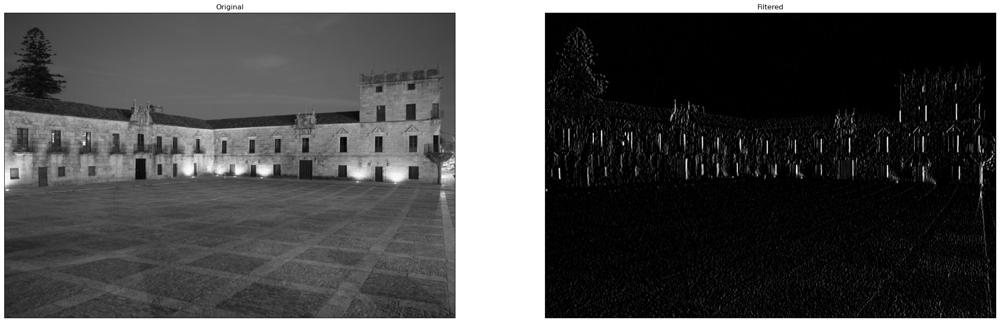

In [12]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread(intro_images_path+'pazo.jpg',0)
kernel = np.array([[-1, 0, 1], [-1, 0, 1],[-1, 0,1]]) 
dst = cv2.filter2D(img,0,kernel)

plt.figure(figsize= (0.05*img.shape[0],0.05*img.shape[1]))
plt.subplot(121),plt.imshow(img,'gray'), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst,'gray'), plt.title('Filtered')
plt.xticks([]), plt.yticks([])
plt.show()

#### Convolución para suavizado de imaxes 

O suavizado de imaxes conséguese convolucionándoa cun núcleo de filtro de paso baixo que elimina o contido de alta frecuencia (por exemplo: ruído, bordos). Os bordos desfáganse un pouco nesta operación. Hai varias técnicas de desenfoque:

***Filtrado de medias:***

A idea do filtrado de medias é simplemente substituír o valor de cada píxel dunha imaxe polo valor medio dos seus veciños, incluído el mesmo.
Isto faise convolucionando unha imaxe cun filtro de caixa normalizado. Opencv proporciónanos a función **cv.blur()**, que toma o ancho e o alto do núcleo como parámetros. Un filtro de caixa normalizado de 3x3 tería o seguinte aspecto:

K=[[1/9 1/9 1/9],
[1/9 1/9 1/9],
[1/9 1/9 1/9]]

**Media gaussiana***

Na operación de desenfoque gaussiano, a imaxe convoluciónase cun filtro gaussiano en lugar do filtro de caixa. Opencv proporciónanos o método **dst=GaussianBlur(src ksize, sigma)**, que acepta os seguintes parámetros.
- src − imaxe de entrada
- ksize − tamaño do núcleo.
- sigma − desviación estándar do núcleo gaussiano nas direccións X e Y. Se sigmas é cero, calcúlase a partir de ksize.

dst é a imaxe de saída.

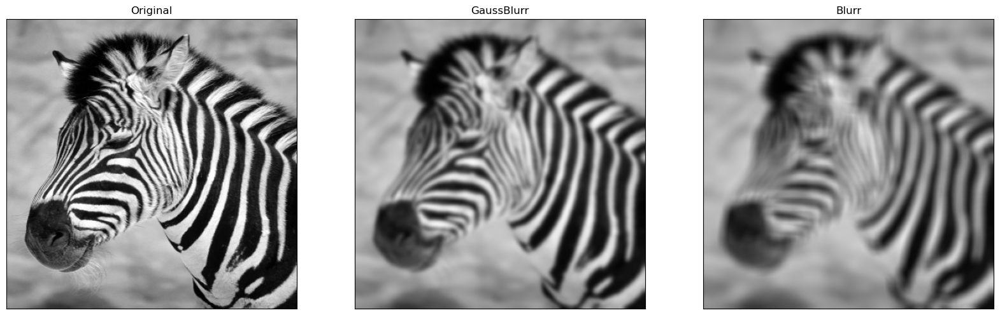

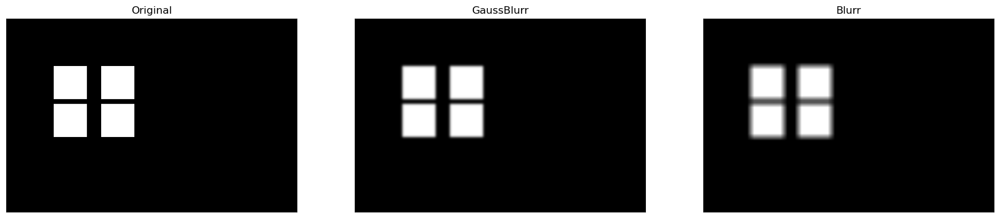

In [13]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread(intro_images_path+'zebra.jpg')

blur1 = cv2.GaussianBlur(img,(15,15),0)
blur2 = cv2.blur(img,(15,15))

plt.figure(figsize= (0.05*img.shape[0],0.05*img.shape[1]))
plt.subplot(131),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(blur1,'gray'),plt.title('GaussBlurr')
plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(blur2),plt.title('Blurr')
plt.xticks([]), plt.yticks([])
plt.show()

cv2.imwrite(output_images_path+'zebragb.jpg',blur1)
cv2.imwrite(output_images_path+'zebrab.jpg',blur2)

img = cv2.imread(intro_images_path+'gate.jpg')

img2 = np.zeros(img.shape[:2], np.uint8)
img2[100:170, 100:170] = 255
img2[180:250, 100:170] = 255
img2[100:170, 200:270] = 255
img2[180:250, 200:270] = 255
blur1 = cv2.GaussianBlur(img2,(15,15),0)
blur2 = cv2.blur(img2,(15,15))

plt.figure(figsize= (0.05*img2.shape[0],0.05*img2.shape[1]))
plt.subplot(131),plt.imshow(img2,'gray'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(blur1,'gray'),plt.title('GaussBlurr')
plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(blur2,'gray'),plt.title('Blurr')
plt.xticks([]), plt.yticks([])
plt.show()

### Pirámides de imaxes

Unha pirámide de imaxes é unha colección de imaxes que se obteñen normalmente mediante a submostraxe dunha única imaxe orixinal. É un conxunto de capas nas que canto máis alta sexa a capa, menor será o tamaño.

As pirámides de imaxes utilízanse para lograr un procesamento invariante á escala en contextos como os seguintes:
- coincidencia de modelos
- detección de puntos de interese
- detección de obxectos

http://szeliski.org/Book/

#### Pirámide gaussiana

Os pasos básicos para construír unha pirámide gaussiana de imaxes son:
- Suavizar a imaxe cunha gaussiana
- Reducir as dimensións da imaxe á metade descartando cada dúas filas e cada dúas columnas
- Repetir este proceso ata que se alcancen os niveis numéricos desexados ou o tamaño da imaxe alcance un mínimo


### Exercicio: Comparación entre pirámides con e sen suavizado antes da redución de escala

(491, 383)


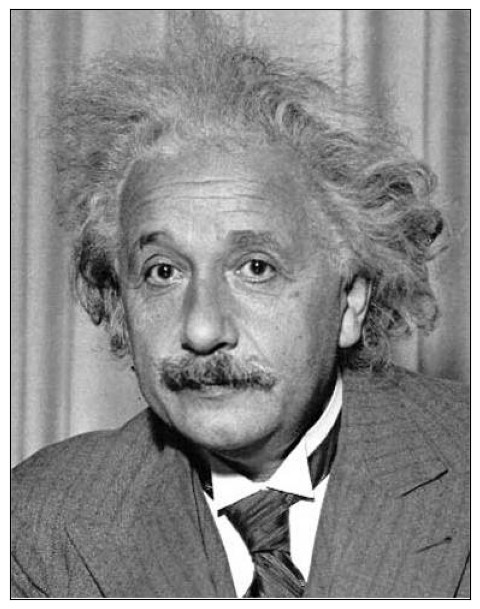

(246, 192)


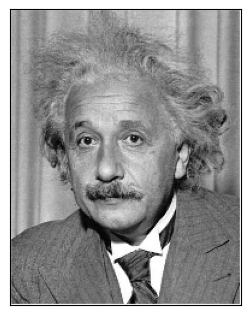

(123, 96)


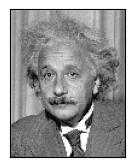

(62, 48)


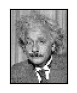

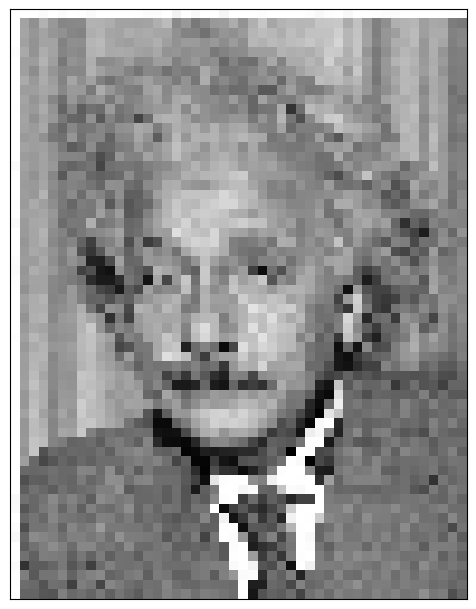

(491, 383)


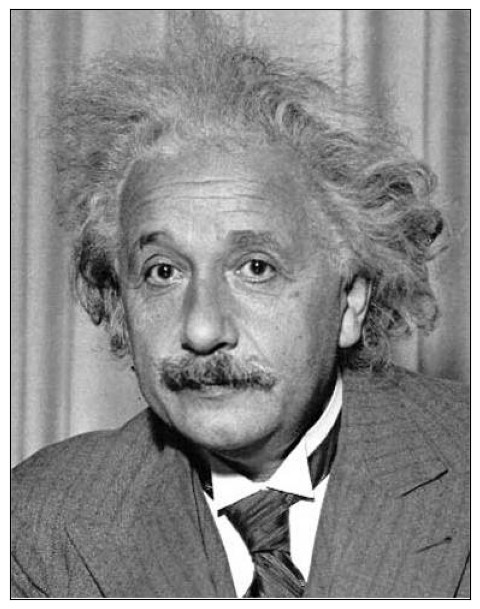

(246, 192)


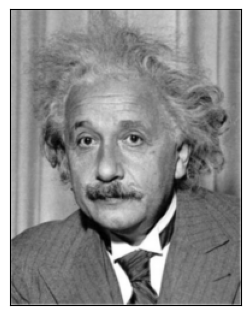

(123, 96)


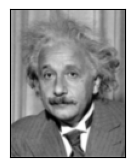

(62, 48)


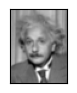

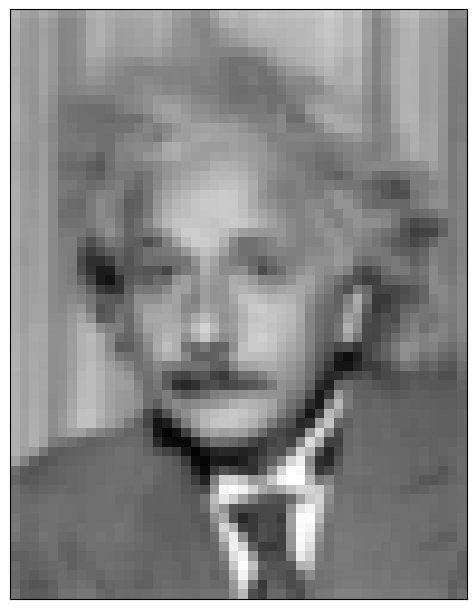

In [14]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt
from skimage import data

def pyramid_bf(image,l=5, minSizex=8, minSizey=8):
# yield the original image
    level=0
    yield image
    # keep looping over the pyramid
    while True:
        if level==l or image.shape[0]<minSizex or image.shape[1]<minSizey:
            break
        h,w=image.shape[:2]
        image=image[:h+1:2,:w+1:2]
        # if the resized image does not meet the supplied minimum
        # size, then stop constructing the pyramid
        # yield the next image in the pyramid
        yield image
        level=level+1
            
            
def pyramid_sm(image,l=5, minSizex=8, minSizey=8):
    level=0
    yield image
    while True:
        if level==l or image.shape[0]<minSizex or image.shape[1]<minSizey:
            break
        image = cv2.GaussianBlur(image,(5,5),0)
        h,w=image.shape[:2]
        image=image[:h+1:2,:w+1:2]
        
        yield image
        level=level+1

image = cv2.imread(intro_images_path + 'einstein.jpg',0)#'aliasing.jpg',0)#

for layer in pyramid_bf(image,l=3):
    print(layer.shape)
    plt.figure(figsize= (0.02*layer.shape[0],0.02*layer.shape[1]))
    plt.imshow(layer,cmap='gray')
    plt.xticks([]), plt.yticks([]) 
    plt.show()

plt.figure(figsize= (0.02*image.shape[0],0.02*image.shape[1]))
plt.imshow(layer,cmap='gray')
plt.xticks([]), plt.yticks([]) 
plt.show()

for layer in pyramid_sm(image, l=3):
    print(layer.shape)
    plt.figure(figsize= (0.02*layer.shape[0],0.02*layer.shape[1]))
    plt.imshow(layer,cmap='gray')
    plt.xticks([]), plt.yticks([]) 
    plt.show()

plt.figure(figsize= (0.02*image.shape[0],0.02*image.shape[1]))
plt.imshow(layer,cmap='gray')
plt.xticks([]), plt.yticks([]) 
plt.show()


**OpenCV ten unha función específica para reducir a escala de imaxes: cv2.pyrDown()**

(491, 383)


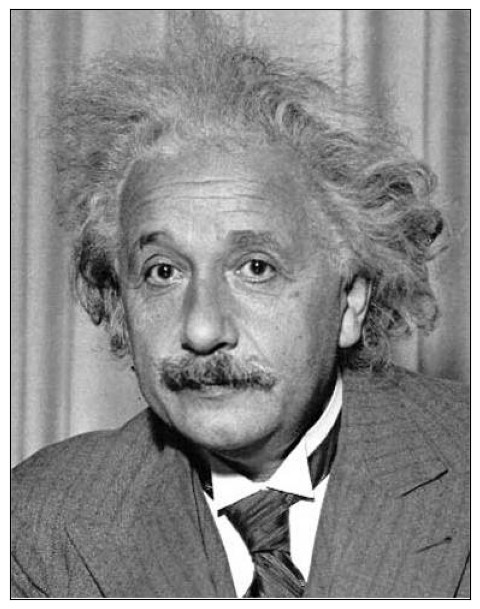

(491, 383)
(246, 192)


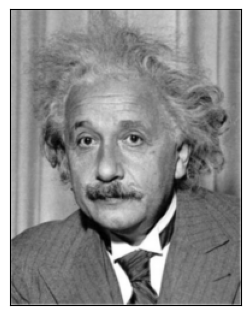

(123, 96)


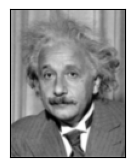

(62, 48)


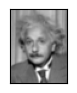

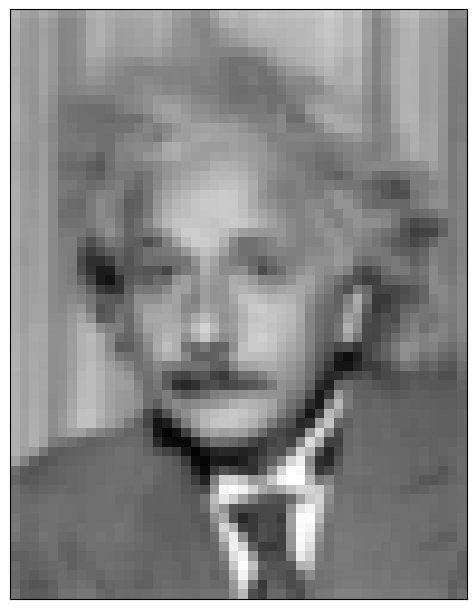

In [44]:
def pyramid(layer, l=4, minSizex=8, minSizey=8):
    level=0
    yield layer
    print(layer.shape)
    while True:
        layer = cv2.pyrDown(layer)
        if level== l or layer.shape[0]<minSizex or layer.shape[1]<minSizey:
            break
        yield layer
        level=level+1
        
for layer in pyramid(image, l=3):
    print(layer.shape)
    plt.figure(figsize= (0.02*layer.shape[0],0.02*layer.shape[1]))
    plt.imshow(layer,cmap='gray')
    plt.xticks([]), plt.yticks([]) 
    plt.show()

plt.figure(figsize= (0.02*image.shape[0],0.02*image.shape[1]))
plt.imshow(layer,cmap='gray')
plt.xticks([]), plt.yticks([]) 
plt.show()

---
---
# EXERCICIO 2.1 (x.x puntos): Correspondencia de modelos e pirámide gaussiana

https://docs.opencv.org/3.4.2/d4/dc6/tutorial_py_template_matching.html

A correspondencia de modelos é un método para buscar e atopar a localización dunha imaxe modelo nunha imaxe máis grande. Para xestionar diferentes tamaños de aparición do modelo, podemos aproveitar as pirámides de imaxes.

Baseándonos nos exercicios sobre a correspondencia de modelos e a construción de pirámides gaussianas, tenta detectar tantos atúns como sexa posible na imaxe Tuna_Relative_Sizes.jpg (intro_images_path) dado o modelo en Tuna_template.jpg.

---
---

In [20]:
intro_images_path='./Images/Intro_images/'
edge_images_path='./Images/Edge_images/'
#seg_images_path='./Images/Seg_images/'
feature_images_path='./Images/Feature_images/'
output_images_path='./Images/Output_images/'
print('Image paths ....')

Image paths ....


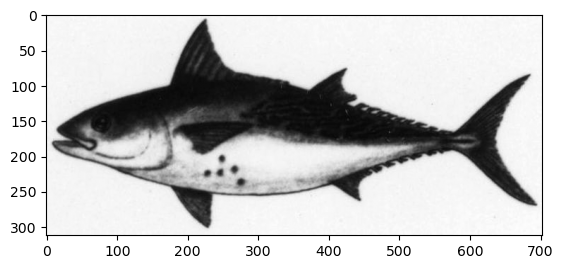

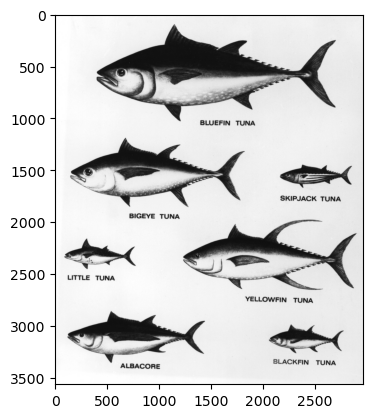

In [67]:
tuna_template = cv2.imread(intro_images_path + 'tuna_template.jpg', cv2.IMREAD_GRAYSCALE)
plt.imshow(tuna_template, cmap='gray')
plt.show()

tuna_relative_sizes = cv2.imread(intro_images_path + 'Tuna_Relative_Sizes.jpg', cv2.IMREAD_GRAYSCALE)
plt.imshow(tuna_relative_sizes, cmap='gray')
plt.show()

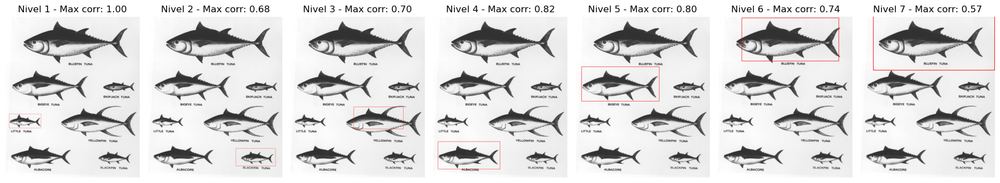

In [ ]:
# Crear pirámide de la imagen completa con escalado gradual
num_levels = 8
scale_factor = 0.8 # para dar saltos menos agresivos en tamaño
image_pyramid = [tuna_relative_sizes] # nivel 0 es la imagen original
for i in range(1, num_levels): 
    h, w = image_pyramid[-1].shape
    new_size = (int(w * scale_factor), int(h * scale_factor)) # ancho, alto
    
    # si la imagen es más pequeña que la plantilla, se detiene el escalado
    if new_size[0] < tuna_template.shape[1] or new_size[1] < tuna_template.shape[0]: 
        break
    image_pyramid.append(cv2.resize(image_pyramid[-1], new_size, interpolation=cv2.INTER_AREA))

plt.figure(figsize=(18, 8))
for idx, img_scaled in enumerate(image_pyramid):
    result = cv2.matchTemplate(img_scaled, tuna_template, cv2.TM_CCOEFF_NORMED)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    h, w = tuna_template.shape
    match_img = cv2.cvtColor(img_scaled, cv2.COLOR_GRAY2RGB)
    cv2.rectangle(match_img, max_loc, (max_loc[0] + w, max_loc[1] + h), (255, 0, 0), 2)
    plt.subplot(1, len(image_pyramid), idx + 1)
    plt.imshow(match_img)
    plt.title(f'Nivel {idx+1} - Max corr: {max_val:.2f}')
    plt.axis('off')

plt.tight_layout()
plt.show()


---
---
## Detección de bordos


### Derivadas de imaxe
OpenCV ofrece tres tipos de filtros  de derivada (paso alto): Sobel, Scharr e Laplaciano.

https://docs.opencv.org/4.3.0/d5/d0f/tutorial_py_gradients.html

https://docs.opencv.org/3.4.2/d5/d0f/tutorial_py_gradients.html


#### Filtros de primeira derivada: Sobel e Scharr

Os operadores de Sobel combinan a suavización e a diferenciación gaussianas, polo que o resultado é máis ou menos resistente ao ruído.

**dst= cv.Sobel(src, ddepth, dx, dy, [, ksize[, scale[, delta[, borderType]]]])**

- Dirección das derivadas: pasando valores {0,1} como argumentos de dx e dy respectivamente.

- Tamaño do núcleo: argumento ksize. Se ksize = -1, úsase un filtro Scharr 3x3 que dá mellores resultados que o filtro Sobel 3x3.

Os filtros de gradiente tamén se poden aplicar usando a función **cv2.Filter2D()**.

Os seguintes son os núcleos 3x3 correspondentes ás primeiras derivadas de imaxe x e y: derivada simple sen suavización gaussiana, Sobel e Scharr.


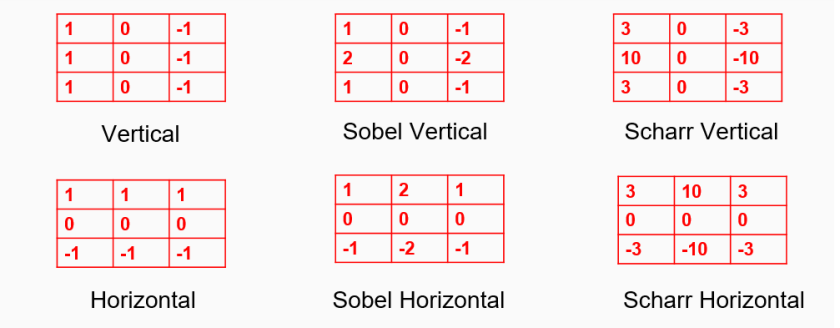

#### Filtros de segundas derivadas: Laplaciano

O laplaciano é a suma das segundas derivadas parciais. Opencv ten a función **cv2.laplacian()** que implementa as derivadas usando a regra da cadea e os filtros de Sobel.

**dst= cv2.Laplacian(src, ddepth,[ksize[, scale[, delta[, borderType]]]])**

Se ksize == 1 (predeterminado), entón úsase o seguinte núcleo para o filtrado:
K=[[0, 1, 0]
[1,-4, 1]
[0, 1, 1]]

O código de abaixo mostra exemplos con todos estes operadores usando máscara 3x3. A profundidade da imaxe de saída pásase como parámetro para obter o resultado no tipo np.uint8.

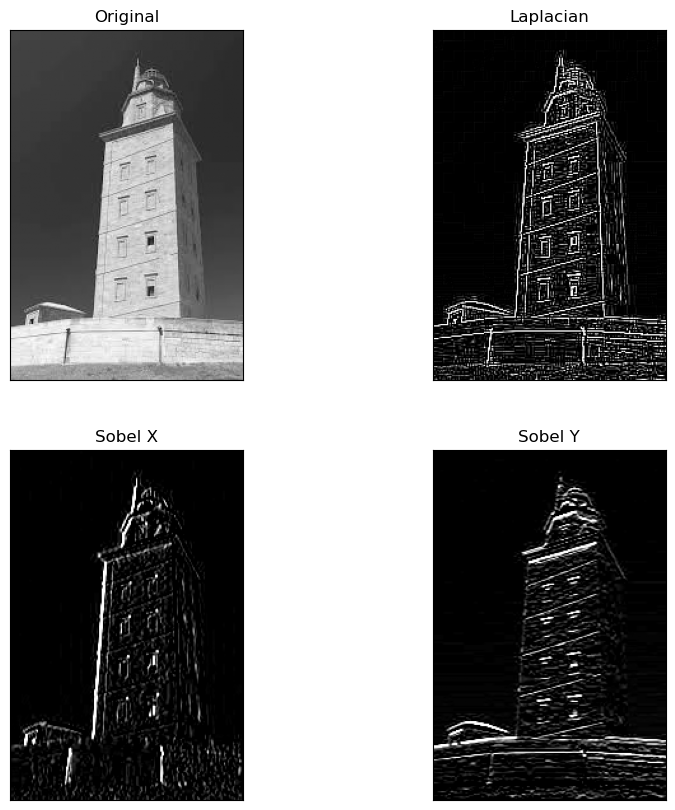

In [15]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread(edge_images_path+'hercules_tower.jpg',0)
laplacian = cv2.Laplacian(img, cv2.CV_8U,ksize=3)
sobelx = cv2.Sobel(img, cv2.CV_8U,1,0,ksize=3)
sobely = cv2.Sobel(img, cv2.CV_8U,0,1,ksize=3)

plt.figure(figsize=[10,10])
plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])

plt.show()

**IMPORTANTE!**

O tipo de datos de saída pode ser cv2.CV_8U ou np.uint8, pero hai un pequeno problema con iso. A transición de negro a branco tómase como pendente positiva (ten un valor positivo) mentres que a transición de branco a negro tómase como pendente negativa (ten un valor negativo). Polo tanto, cando convertes datos a np.uint8, todas as pendentes negativas convértense en cero. En palabras sinxelas, perdes eses bordos.
Se queres detectar ambas bordos, a mellor opción é manter o tipo de datos de saída nalgunhas formas superiores, como cv2.CV_64F, tomar o seu valor absoluto e logo convertelo de novo a cv2.CV_8U. O código a continuación demostra este procedemento para un filtro de Sobel horizontal e a diferenza nos resultados.

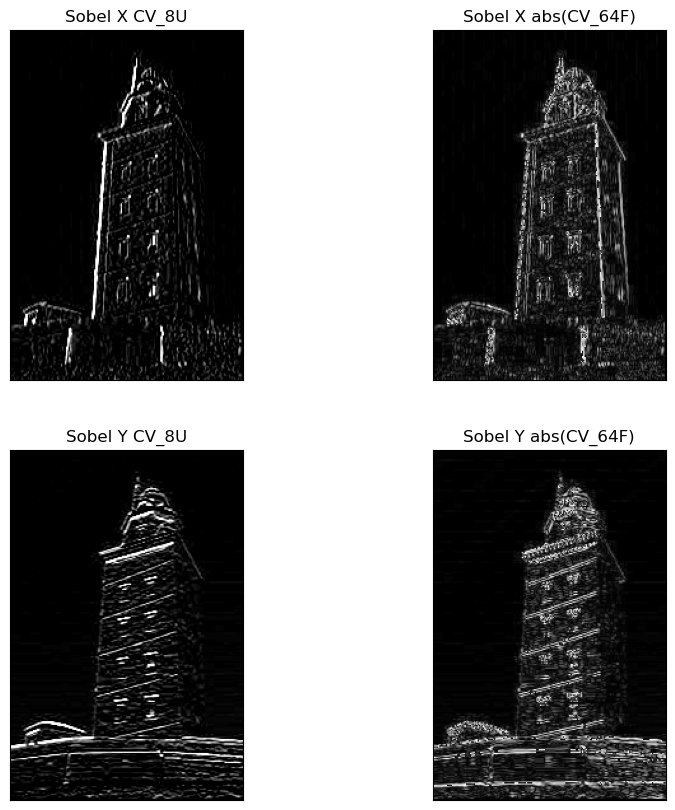

In [16]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread(edge_images_path+'hercules_tower.jpg',0)
laplacian = cv2.Laplacian(img, cv2.CV_8U,ksize=3)

# Output dtype = cv2.CV_8U
sobelx8u = cv2.Sobel(img,cv2.CV_8U,1,0,ksize=3)
sobely8u = cv2.Sobel(img,cv2.CV_8U,0,1,ksize=3)

# Output dtype = cv2.CV_64F. Then take its absolute and convert to cv2.CV_8U to visualze ite
sobelx64f = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=3)
sobely64f = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=3)
abs_sobelx64f = np.absolute(sobelx64f)
sobelx64f_to_8u = np.uint8(abs_sobelx64f)
abs_sobely64f = np.absolute(sobely64f)
sobely64f_to_8u = np.uint8(abs_sobely64f)

plt.figure(figsize=[10,10])

plt.subplot(2,2,1),plt.imshow(sobelx8u,cmap = 'gray')
plt.title('Sobel X CV_8U'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(sobelx64f_to_8u,cmap = 'gray')
plt.title('Sobel X abs(CV_64F)'), plt.xticks([]), plt.yticks([])

plt.subplot(2,2,3),plt.imshow(sobely8u,cmap = 'gray')
plt.title('Sobel Y CV_8U'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely64f_to_8u,cmap = 'gray')
plt.title('Sobel Y abs(CV_64F)'), plt.xticks([]), plt.yticks([])

plt.show()

## Filtros de Primeira e Segunda Derivada dunha Gaussiana e Gradiente

### Operacións gaussianas 2D separables en operacións gaussianas 1D

O núcleo gaussiano 2D vén dado por

$$
g(x,y) \;=\; \frac{1}{2\pi\sigma^2}\,\exp\!\left(-\frac{x^2+y^2}{2\sigma^2}\right)
$$

A gaussiana 2D **isotrópica** é *separable* en produtos de gaussianas 1D:

$$
g(x,y) \;=\;
\left(\frac{1}{\sqrt{2\pi}\,\sigma}\,\exp\!\left(-\frac{x^2}{2\sigma^2}\right)\right)
\left(\frac{1}{\sqrt{2\pi}\,\sigma}\,\exp\!\left(-\frac{y^2}{2\sigma^2}\right)\right)
\;=\; g(x)\,g(y)
$$

Esta propiedade separable simplifica a convolución 2D nunha serie de convolucións 1D, con grandes ganancias computacionais:

\[
\begin{aligned}
(g \star f)(x,y)
&= \int_{-\infty}^{\infty}\!\!\int_{-\infty}^{\infty}
f(u,v)\,g(x-u)\,g(y-v)\,du\,dv \\
&= \int_{-\infty}^{\infty}
\Bigg( \int_{-\infty}^{\infty} f(u,v)\,g(y-v)\,dv \Bigg)\,
g(x-u)\,du \\
&= \big(f \star g_y\big)(x,y)\;\star\; g_x
\end{aligned}
\]

onde \(g_x(x)=g(x)\) e \(g_y(y)=g(y)\).

**Algoritmo para convolución gaussiana 2D usando dúas pasadas 1D:**
1. Na **imaxe orixinal**, realiza convolucións 1D ao longo das **columnas** usando a gaussiana 1D.
2. Na **saída do paso 1**, realiza convolucións 1D ao longo das **filas** usando a gaussiana 1D.


### Magnitude e dirección do gradiente

Sexa a saída da convolución da imaxe $f(x,y)$ co gradiente, $\nabla g(x, y)$, denotada por $\left [ \begin{array}{c} h_x(x, y) \\ h_y(x, y) \end{array} \right ]$.

\begin{equation}
\left [ \begin{array}{c} h_x(x, y) \\
h_y(x, y) \end{array} \right ] =
\left [ \begin{array}{c} f(x, y) \star \frac{d}{dx} g(x, y) \\ f(x, y) \star \frac{d}{dy} g(x, y) \end{array} \right ]
\end{equation}

Esta imaxe de gradiente pódese describir en termos da súa magnitude, $ \sqrt{h_x^2(x, y) + h_y^2(x, y)}$, e a súa dirección, $\theta = \tan^{-1} \frac{h_y(x, y)}{h_x(x, y)}$. A magnitude denotará a forza do bordo da imaxe, e os bordos máis fortes estarán asociados con magnitudes maiores. A dirección, $\theta$, denotará unha dirección perpendicular ao bordo.

### Laplaciano dunha gaussiana (LoG)

O equivalente 2D da segunda derivada dunha gaussiana é o **Laplaciano dunha gaussiana** (LoG)

$$
\nabla^2 h(x,y) \;=\; 
\frac{\partial^2}{\partial x^2} h(x,y)
\;+\;
\frac{\partial^2}{\partial y^2} h(x,y)
$$

Os neurocientíficos atoparon esta forma de núcleo ou filtro na retina dos ollos. Foi un dos primeiros detectores de bordos propostos.

O Laplaciano dun Gaussiana pode aproximarse pola diferenza de dúas Gaussianas (DoG) con razón ente sigmas de arredor de 1.6.


In [17]:
from scipy import ndimage
import scipy.ndimage as scimage
#from scipy.ndimage import convolve
from scipy import misc


def gaussian (x, sigma):
    g = np.exp(-(x**2/(2*sigma*sigma)))*(1/(np.sqrt(2*np.pi)*sigma))
    return (g/g.sum())
#------------------------------------------------------------------
def first_derivative_of_gaussian (x, sigma):
    dg = np.exp(-(x**2/(2*sigma*sigma)))*(-x/(np.sqrt(2*np.pi)*sigma**3))
    return (dg)
#------------------------------------------------------------------
def second_derivative_of_gaussian (x, sigma):
    return (np.exp(-(x**2/(2*sigma*sigma)))*(-(1 - x*x/(sigma*sigma))/(np.sqrt(2*np.pi)*sigma**3)))

#------------------------------------------------------------------
def image_convolve_gaussian (image, sigma) :
    N = np.round(3*(sigma+1))
    t = np.arange(-N, N)  # Note the width of the kernel, need to be this large to capture most of the shape
    g = gaussian(t, sigma) # 1D gaussian kernel
    # Process rows
    output = image.copy()
    for i in range (image.shape[0]):
        output[i,:] = scimage.convolve(output[i, :], g)
    # Process columns
    for j in range (image.shape[1]):
        output[:, j] = scimage.convolve(output[:, j], g)
    return (output)
#------------------------------------------------------------------
def image_convolve_gradient_gaussian (image, sigma) :
    N = np.round(3*(sigma+1))
    t = np.arange(-N, N)  # Note the width of the kernel, need to be this large to capture most of the shape
    g = gaussian(t, sigma) # 1D gaussian kernel
    dg = first_derivative_of_gaussian(t, sigma) # 1D first derivative gaussian kernel

    # Process rows
    gradX = image.copy()
    for i in range (image.shape[0]):
        gradX[i,:] = scimage.convolve(gradX[i, :], dg)
    # Process columns
    for j in range (image.shape[1]):
        gradX[:, j] = scimage.convolve(gradX[:, j], g)

    gradY = image.copy()
    for i in range (image.shape[0]):
        gradY[i,:] = scimage.convolve(gradY[i, :], g)
    # Process columns
    for j in range (image.shape[1]):
        gradY[:, j] = scimage.convolve(gradY[:, j], dg)

    return (gradX, gradY)

#------------------------------------------------------------------
def image_convolve_LoG (image, sigma) :
    N = np.round(4*(sigma+1)) # Note larger width
    t = np.arange(-N, N)  # Note the width of the kernel, need to be this large to capture most of the shape
    g = gaussian(t, sigma) # 1D gaussian kernel
    ddg = second_derivative_of_gaussian (t, sigma) # 1D first derivative gaussian kernel

    # Process rows
    dXX = image.copy()
    for i in range (image.shape[0]):
        dXX[i,:] = scimage.convolve(dXX[i, :], ddg)
    # Process columns
    for j in range (image.shape[1]):
        dXX[:, j] = scimage.convolve(dXX[:, j], g)

    dYY = image.copy()
    for i in range (image.shape[0]):
        dYY[i,:] = scimage.convolve(dYY[i, :], g)
    # Process columns
    for j in range (image.shape[1]):
        dYY[:, j] = scimage.convolve(dYY[:, j], ddg)

    return (dXX+dYY)



C:\Users\marti\AppData\Local\Temp\ipykernel_22948\3611418049.py:4: DeprecationWarning: scipy.misc is deprecated and will be removed in 2.0.0
  from scipy import misc


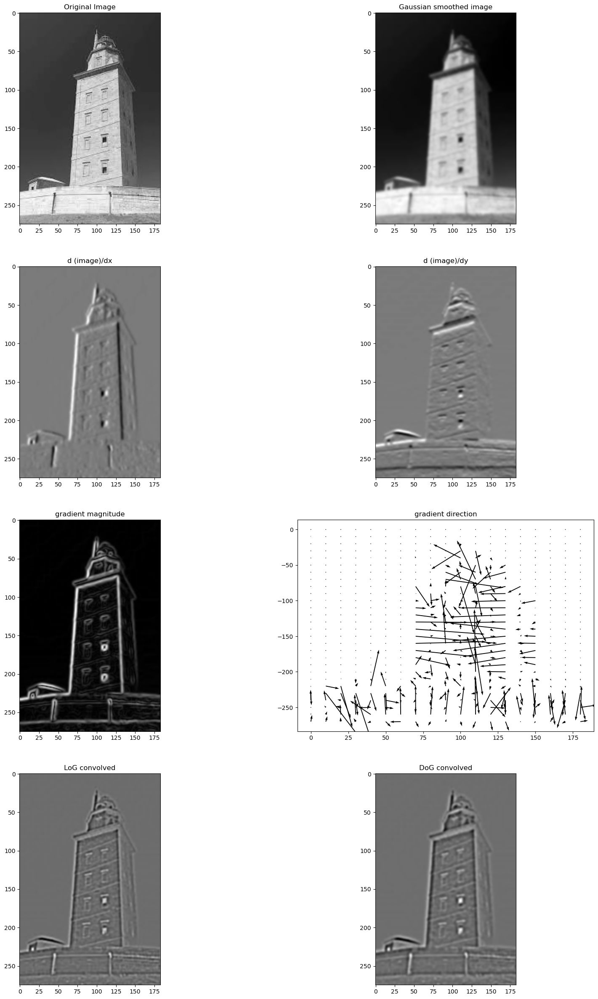

In [18]:
#------------------------------------------------------------------
from skimage import io  #has functions to read and write images
from skimage import color as change # contains function to change between color spaces

# Load an color image in grayscale
img = io.imread(edge_images_path+'hercules_tower.jpg',0)
#img = change.rgb2gray(change.rgba2rgb(img))
img = img.astype(float)  # need to change type from uint8 to float

smoothed_image_1 = image_convolve_gaussian (img, 1.5)
smoothed_image_2 = image_convolve_gaussian (img, 2.3) #sigma ratio _ 1.6

image_dx, image_dy = image_convolve_gradient_gaussian(img, 1.5)
image_log = image_convolve_LoG (img, 1.5)

#-------------------------------------------------------------
plt.figure(figsize=(20,30))

plt.subplot(4,2,1)
plt.imshow(img, cmap='gray')
plt.title ('Original Image')
plt.subplot(4,2,2)
plt.imshow(smoothed_image_1, cmap='gray')
plt.title ('Gaussian smoothed image')

# Show image gradient
plt.subplot(4,2,3)
plt.imshow(image_dx, cmap='gray')
plt.title('d (image)/dx')
plt.subplot(4,2,4)
plt.imshow(image_dy, cmap='gray')
plt.title('d (image)/dy');

# Show image gradient magnitude and orientation
plt.subplot(4,2,5)
grad_mag = np.sqrt(image_dx*image_dx + image_dy*image_dy)+0.0001
plt.imshow(grad_mag, cmap='gray')
plt.title('gradient magnitude')
plt.subplot(4,2,6)
# Show the gradient directions every 10th pixel otherwise it is too crowded.
x = np.arange(0, img.shape[1], 10)
y = np.arange(0, img.shape[0], 10)
X, Y = np.meshgrid(x, y)
plt.quiver(X, -Y, image_dx[::10,::10], -image_dy[::10,::10])
plt.title('gradient direction');

# Show Laplacian of Gaussian
plt.subplot(4,2,7)
plt.imshow(image_log, cmap='gray')
plt.title('LoG convolved')
plt.subplot(4,2,8)
plt.imshow(smoothed_image_2 - smoothed_image_1, cmap='gray')
plt.title('DoG convolved');

### Exercicio: Detector de bordos de Canny

https://docs.opencv.org/4.3.0/da/d22/tutorial_py_canny.html
https://docs.opencv.org/3.4.2/da/d22/tutorial_py_canny.html

O algoritmo Canny foi deseñado para cumprir os criterios de boa detección, boa localización e resposta única. Emprega varias etapas, como se mostra a continuación. OpenCV impleméntao como a función cv2.Canny().

**edges = cv2.Canny(image, threshold1, threshold2[,edges [,apertureSize[, L2gradient]]])**

- O primeiro argumento é a imaxe de entrada.
- O segundo e o terceiro argumentos son os limiares.
O primeiro (o máis baixo) úsase para a vinculación de bordos.
Mentres que threshold2 (o máis alto) úsase para atopar segmentos iniciais de bordos fortes.
- O argumento apertureSize é o tamaño da máscara de Sobel usado para calcular gradientes de imaxe. Por defecto é 3.
- O último argumento é L2gradient, que especifica a ecuación para medir a magnitude do gradiente. Se é True (Verdadeiro), úsase a norma L2, que adoita ser máis precisa. Por defecto, é False (Falso) e úsase a norma L1.

![canny_detector.png](anexo:canny_detector.png)

Podes atopar unha implementación detallada do detector Canny aquí: https://towardsdatascience.com/canny-edge-detection-step-by-step-in-python-computer-vision-b49c3a2d8123

kernel size:10
51.0
10.200000000000001


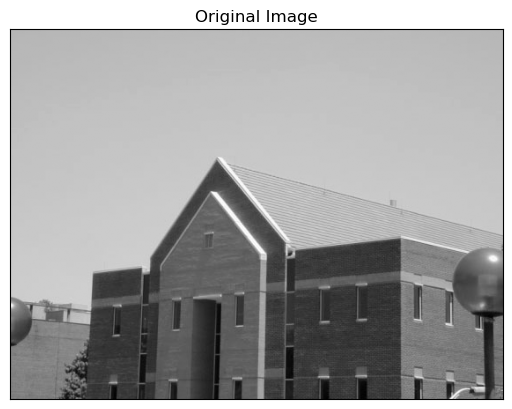

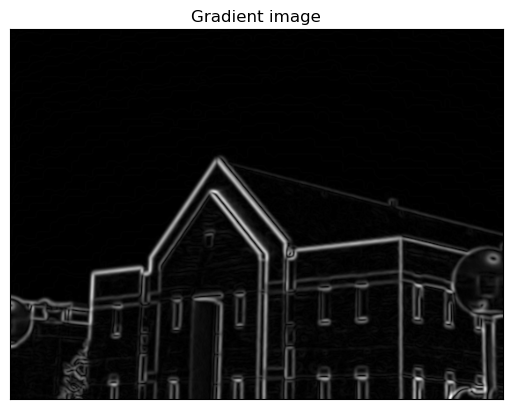

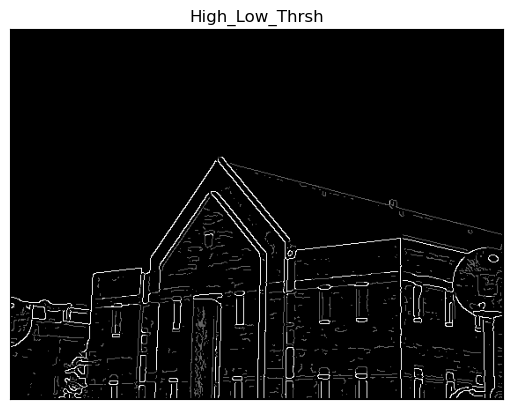

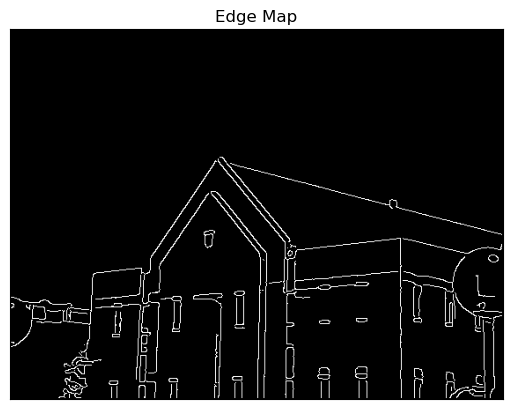

In [19]:
from scipy import ndimage
from scipy.ndimage import convolve
from scipy import misc
import numpy as np
from matplotlib import pyplot as plt
import cv2 
import matplotlib

class cannyEdgeDetector:
    def __init__(self, imgs, sigma=1, kernel_size=0, weak_pixel=75, strong_pixel=255, lowthreshold=0.05, highthreshold=0.15):
        self.img = imgs
        self.edge_map = None
        self.img_smoothed = None
        self.gradientMat = None
        self.thetaMat = None
        self.nonMaxImg = None
        self.double_thresholdImg = None
        self.thresholdImg = None
        self.weak_pixel = weak_pixel
        self.strong_pixel = strong_pixel
        self.sigma = sigma
        self.kernel_size = kernel_size
        self.lowThreshold_r = lowthreshold
        self.highThreshold_r = highthreshold
        self.lowThreshold = None
        self.highThreshold = None
        return 
    
    
    def gaussian_kernel(self):  
        if self.kernel_size<3:
            size2=6*self.sigma;#size2=6.0*np.sqrt(2)*self.sigma;
            self.kernel_size=int(size2)+1; #real value of filter size
        print('kernel size:'+ str(self.kernel_size)) 
        
        size=int(self.kernel_size)//2
        x, y = np.mgrid[-size:size+1, -size:size+1]
        normal = 1 / (2.0 * np.pi * self.sigma**2)
        g = normal * np.exp(-((x**2 + y**2) / (2.0*self.sigma**2)))
        return g
    
    def sobel_filters(self, img):
        Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
        Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)

        Ix = ndimage.convolve(img.astype(float), Kx)
        Iy = ndimage.convolve(img.astype(float), Ky)
        
        
        G=np.hypot(Ix,Iy)
        G = (G / G.max())* 255
        theta = np.arctan2(Iy, Ix)

        return (G, theta)
    

    def non_max_suppression(self, img, D):
        M, N = img.shape
        Z = np.zeros((M,N), dtype=np.int32)
        angle = D * 180. / np.pi
        angle[angle < 0] += 180


        for i in range(1,M-1):
            for j in range(1,N-1):
                try:
                    q = 255
                    r = 255

                   #angle 0
                    if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                        q = img[i, j+1]
                        r = img[i, j-1]
                    #angle 45
                    elif (22.5 <= angle[i,j] < 67.5):
                        q = img[i+1, j-1]
                        r = img[i-1, j+1]
                    #angle 90
                    elif (67.5 <= angle[i,j] < 112.5):
                        q = img[i+1, j]
                        r = img[i-1, j]
                    #angle 135
                    elif (112.5 <= angle[i,j] < 157.5):
                        q = img[i-1, j-1]
                        r = img[i+1, j+1]

                    if (img[i,j] >= q) and (img[i,j] >= r):
                        Z[i,j] = img[i,j]
                    else:
                        Z[i,j] = 0


                except IndexError as e:
                    pass

        return Z

    def threshold(self, img):
        

        highThreshold = img.max() * self.highThreshold_r;
        lowThreshold = highThreshold * self.lowThreshold_r;
        self.highThreshold =highThreshold
        self.lowThreshold =lowThreshold
        
        print(self.highThreshold)
        print(self.lowThreshold)

        M, N = img.shape
        res = np.zeros((M,N), dtype=np.int32)

        weak = np.int32(self.weak_pixel)
        strong = np.int32(self.strong_pixel)

        strong_i, strong_j = np.where(img >= highThreshold)
        zeros_i, zeros_j = np.where(img < lowThreshold)

        weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))

        res[strong_i, strong_j] = strong
        res[weak_i, weak_j] = weak

        return (res)

    def hysteresis(self, img):

        M, N = img.shape
        weak = self.weak_pixel
        strong = self.strong_pixel
        c=1
        while c>0:
            c=0
            for i in range(1, M-1):
                for j in range(1, N-1):
                    if (img[i,j] == weak):
                        try:
                            if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                            or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                            or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                                img[i, j] = strong
                                c=c+1
                            else:
                                continue# img[i, j] = 0
                        except IndexError as e:
                            pass
            #c=0
            
        I, J = np.where(img<strong)
        img[I,J]=0
        return img
    
    def detect(self):
        
        """imgs_final = []
        for i, img in enumerate(self.imgs): 
            
            plt.imshow(img,cmap = 'gray')
            plt.title('smoothed Image')
            plt.show()
            
            self.img_smoothed = convolve(img, self.gaussian_kernel(self.kernel_size, self.sigma))
            plt.imshow(self.img_smoothed,cmap = 'gray')
            plt.title('smoothed Image')
            plt.show()
            
            self.gradientMat, self.thetaMat = self.sobel_filters(self.img_smoothed)
            self.nonMaxImg = self.non_max_suppression(self.gradientMat, self.thetaMat)
            self.thresholdImg = self.threshold(self.nonMaxImg)
            img_final = self.hysteresis(self.thresholdImg)
            self.imgs_final.append(img_final)
            
        return self.imgs_final
        """
        
        self.img_smoothed = convolve(self.img, self.gaussian_kernel())
        self.gradientMat, self.thetaMat = self.sobel_filters(self.img_smoothed)
        #plt.imshow(self.gradientMat,cmap = 'gray')
        #plt.title('gradient'), plt.xticks([]), plt.yticks([])
        #plt.show() 
        
        
        
        self.nonMaxImg = self.non_max_suppression(self.gradientMat, self.thetaMat)
        
        self.thresholdImg = self.threshold(self.nonMaxImg)
        self.double_thresholdImg=self.thresholdImg.copy()
        #plt.imshow(self.thresholdImg,cmap = 'gray')
        #plt.title('High_low_thrsh'), plt.xticks([]), plt.yticks([])
        #plt.show() 
        
        self.edge_map = self.hysteresis(self.thresholdImg)

        return self.edge_map
    

img = cv2.imread(edge_images_path+'building.jpg',0)


detector = cannyEdgeDetector(img, sigma=1.5, kernel_size=0, weak_pixel=100, strong_pixel=255, 
                             lowthreshold=0.20, highthreshold=0.2)
edges = detector.detect()

plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.show() 


plt.imshow(detector.gradientMat.astype(int),cmap = 'gray')
plt.title('Gradient image'), plt.xticks([]), plt.yticks([])
plt.show() 


plt.imshow(detector.double_thresholdImg,cmap = 'gray')
plt.title('High_Low_Thrsh'), plt.xticks([]), plt.yticks([])
plt.show() 


plt.imshow(detector.edge_map,cmap = 'gray')
plt.title('Edge Map'), plt.xticks([]), plt.yticks([])
plt.show()

###  Bordos a diferentes escalas 

* As escalas máis baixas correspóndense con valores máis baixos de $\sigma$
* As escalas máis baixas localizan mellor os bordos, porén tamén aparecen moitos bordos ruidosos.
* As escalas máis altas rexeitan mellor o ruído, pero detectan principalmente os bordos máis fortes

Neste exemplo empréganse funcións de OpenCV para facer as operacións de suavizado Gaussiano e o detector de Canny. **O detector de bordos Canny de OpenCV NON é o detector de bordos Canny!**. Usa un núcleo de 3 por 3 (Sobel) para detectar bordos. Non ten un concepto de escala ($\sigma$) e tecnicamente NON é o operador Canny. O suavizado e a escala gaussianos son parte integral do concepto de bordos Canny.

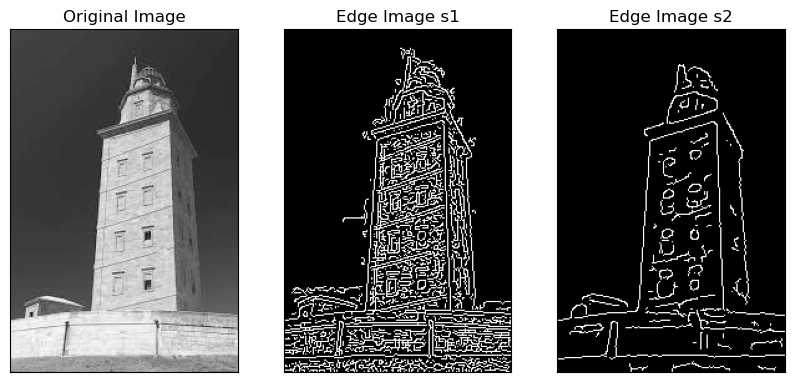

In [20]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

image = cv2.imread(edge_images_path+'hercules_tower.jpg',0)

img=cv2.GaussianBlur(image,(3,3),0) #Smothing 
edges = cv2.Canny(img,5,15,apertureSize=3,L2gradient=True)

plt.figure(figsize=[10,10])
plt.subplot(131),plt.imshow(image,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image s1'), plt.xticks([]), plt.yticks([])

img=cv2.GaussianBlur(image,(15,15),0) 
edges = cv2.Canny(img,5,15,apertureSize=3,L2gradient=True)

plt.subplot(133),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image s2'), plt.xticks([]), plt.yticks([])
plt.show()

---
---

# EXERCICIO 2.2 (x.x puntos): Modelo de intensidade e modelo de bordo para a correspondencia

Compare as dúas seguintes alternativas de correspondencia de modelos en canto ao seu rendemento: (i) caso de usar a imaxe orixinal template.jpg e as tres imaxes search1.jpg, search2.jpg e search3.jpg (intro_images_path); e (ii) caso de usar os mapas de bordos (despois de aplicar o detector canny) de todas elas.

---
---

In [ ]:
intro_images_path='./Images/Intro_images/'
edge_images_path='./Images/Edge_images/'
#seg_images_path='./Images/Seg_images/'
feature_images_path='./Images/Feature_images/'
output_images_path='./Images/Output_images/'
print('Image paths ....')

In [25]:
#SOLUCIÓN AQUÍ

---
---
### Detector Marr-Hildreth:

Detección de Bordos por cruces por cero de DOG (ou LOG)

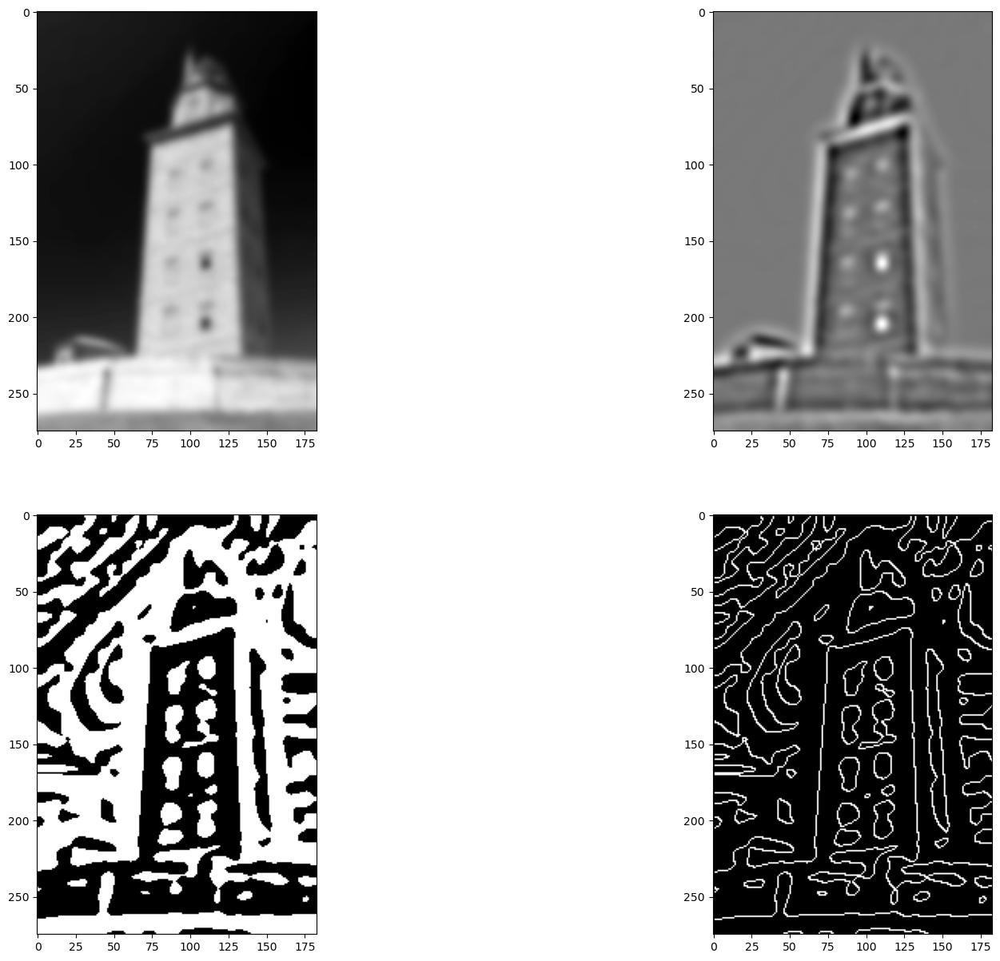

In [21]:
# Load an color image in grayscale
image = cv2.imread(edge_images_path+'hercules_tower.jpg',0)
img = img.astype(float)  # need to change type from uint8 to float

smoothed_image_1 = image_convolve_gaussian (img, 2.5)
smoothed_image_2 = image_convolve_gaussian (img, 4)
DoG = smoothed_image_2 - smoothed_image_1

# Logic to mark the edge pixels
edgeImage = np.zeros(smoothed_image_1.shape)
for y in range (1, smoothed_image_1.shape[0]) :
    for x in range (1, smoothed_image_1.shape[1]) :
        if (((DoG[y, x] * DoG[y-1, x]) < 0) or ((DoG[y, x] * DoG[y, x-1]) < 0)) :
            edgeImage[y, x] = 1

#-----------------------DISPLAY------------------------------
fig, axs = plt.subplots(nrows=2, ncols=2)

fig.set_size_inches (20, 15)

axs[0,0].imshow(img, 'gray')
axs[0,1].imshow(DoG, 'gray')
axs[1,0].imshow(DoG > 0, 'gray')
axs[1,1].imshow(edgeImage, 'gray');

### Mestura de imaxes usando pirámides gaussianas e laplacianas

#### Pirámides gaussianas

Este tipo de pirámide constrúese aplicando repetidamente un filtro de suavizado gaussiano a unha imaxe e reducindo a súa resolución por un factor de dous (filtro pasa-baixa).

#### Pirámide laplaciana

Unha pirámide laplaciana é moi similar a unha pirámide gaussiana, pero garda a imaxe de diferenza das versións suavizadas entre cada nivel (a diferenza de gaussianas aproxímase ao operador laplaciano de gaussiano). As imaxes resultantes son versións filtradas de pasa-banda da imaxe orixinal, que destacan os detalles e os bordos a diferentes niveis de resolución. Só o nivel máis pequeno non é unha imaxe de diferenza.

<img src="./LoG.jpg" width=400/> <img src="./DoG.jpg" width=400/>

#### Fusión de imaxes

- Escolle img1 e img2 e recorta ou re-escala para que teñan o mesmo tamaño
- Crea unha imaxe de máscara dese mesmo tamaño
- Crea unha pirámide gaussiana para img1 e img2
- Crea pirámides laplacianas a partir de pirámides gaussianas
- Crea unha pirámide gaussiana para a máscara
- Fusiona as dúas pirámides laplacianas usando a pirámide gaussiana da máscara para ponderar as dúas imaxes en cada nivel da pirámide
- Obtén a suma acumulada da pirámide laplaciana resultante para obter a imaxe fusionada.

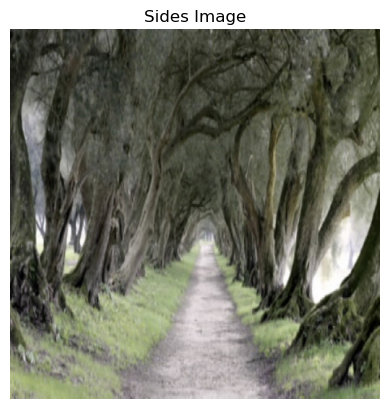

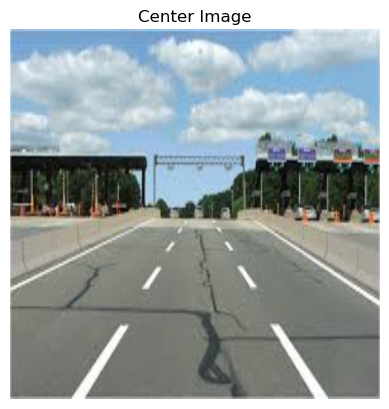

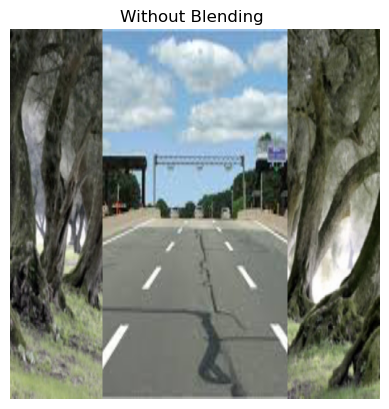

In [22]:
from matplotlib import pyplot as plt
import cv2
import numpy as np

def imshow2(im_title, im):
    ''' This is function to display the image'''
    plt.figure();
    plt.title(im_title);
    plt.axis("off");
    if len(im.shape) == 2:
        plt.imshow(im, cmap = "gray");
    else:
        im_display = cv2.cvtColor(im, cv2.COLOR_RGB2BGR);
        plt.imshow(im_display);
    plt.show();
    
# Load the display the images
im_sides = cv2.imread(edge_images_path+'paseo.jpg').astype(np.float32)
im_center = cv2.imread(edge_images_path+'road2.jpg').astype(np.float32)

im_sides = cv2.resize(im_sides, (512, 512))
im_center = cv2.resize(im_center, (512, 512))
imshow2("Sides Image", im_sides/255);
imshow2("Center Image", im_center/255);

cols=512
#imshow2("Without Blending ", np.hstack((im_sides[:, :int(cols/3)], im_center[:, int(cols/3):int(2*cols/3)],
#                        im_sides[:,int(2*cols/3):])))

im_mask=np.ones((512,512,3),np.float32)
im_mask[:, int(cols/4):int(3*cols/4)]=0
imshow2("Without Blending ",(im_mask*im_sides+ (1-im_mask)*im_center)/255)

In [23]:
# Compute the Gaussian Pyramids
gauss_levels = 6;
gauss_reduce_sides = im_sides.copy()
gauss_pyr_sides = [gauss_reduce_sides]
gauss_reduce_center = im_center.copy()
gauss_pyr_center = [gauss_reduce_center]

gauss_reduce_mask=im_mask.copy()
gauss_pyr_mask=[gauss_reduce_mask]

for i in range(gauss_levels):
    gauss_reduce_sides = cv2.pyrDown(gauss_reduce_sides)
    gauss_pyr_sides.append(gauss_reduce_sides)
    
    gauss_reduce_center = cv2.pyrDown(gauss_reduce_center)
    gauss_pyr_center.append(gauss_reduce_center)
    
    gauss_reduce_mask = cv2.pyrDown(gauss_reduce_mask)
    gauss_pyr_mask.append(gauss_reduce_mask)


# Compute the Laplacian Pyramids
lap_pyr_sides = []
lap_pyr_center = []

for i in range(1, gauss_levels+1):
    h, w = gauss_pyr_sides[i-1].shape[:2];
    sides_append = cv2.subtract(gauss_pyr_sides[i-1], cv2.pyrUp(gauss_pyr_sides[i], dstsize=(w, h)));
    center_append = cv2.subtract(gauss_pyr_center[i-1], cv2.pyrUp(gauss_pyr_center[i], dstsize=(w, h)));
    lap_pyr_sides.append(sides_append)
    lap_pyr_center.append(center_append)

'''
# Display the pyramids 
for index, image in enumerate(gauss_pyr_sides):
    imshow2("Level {}".format(index), image)
for index, image in enumerate(lap_pyr_sides):
    imshow2("Level {}".format(index), image)  
'''
pass

(512, 512, 3)
(256, 256, 3)
(128, 128, 3)
(64, 64, 3)
(32, 32, 3)
(16, 16, 3)
Lowest Laplacian level (16, 16, 3)
Lowest Gaussian level (8, 8, 3)


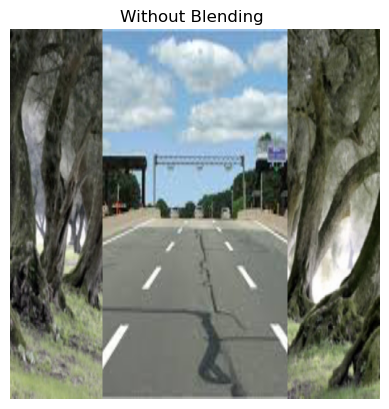

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


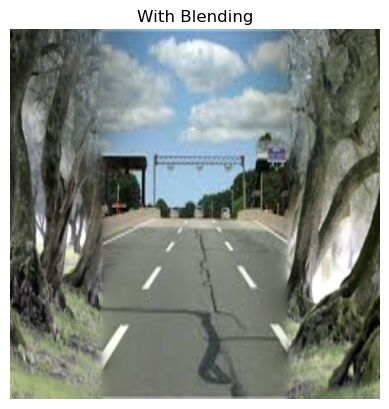

In [31]:
# Combine the images
com_lap = [];
for sides, center, mask in zip(lap_pyr_sides, lap_pyr_center, gauss_pyr_mask):
    print(sides.shape)
    sides=mask*sides
    center=(1-mask)*center
    com_lap.append(sides+center)

print("Lowest Laplacian level {}".format(lap_pyr_sides[-1].shape))
print("Lowest Gaussian level {}".format(gauss_pyr_mask[-1].shape))

# Now reconstruct
cols = gauss_pyr_sides[-2].shape[1]
im_blended=gauss_pyr_mask[-1]*gauss_pyr_sides[-1]+ (1-gauss_pyr_mask[-1])*gauss_pyr_center[-1]

for i in range(len(com_lap)-1, -1, -1):
    h, w = com_lap[i].shape[:2];
    im_blended = cv2.pyrUp(im_blended, dstsize=(w, h))
    im_blended = cv2.add(im_blended, com_lap[i])

# Display the Images
#cols=im_sides.shape[1]

imshow2("Without Blending ",(im_mask*im_sides+ (1-im_mask)*im_center)/255)
imshow2("With Blending", im_blended/255)

### Fusión de imaxes

As imaxes con diferentes exposicións teñen un aspecto moi diferente en termos de brillo e detalles. A medida que a imaxe se subexpón, vólvese escura e perde detalles na rexión máis escura, mentres que a imaxe vólvese demasiado brillante e tamén perde detalles na rexión máis brillante ao sobreexpoñerse. Para capturar todos os detalles da imaxe, é necesario melloralos combinándoos.

Usando unha mestura multirresolución, construíndo pirámides de imaxes gaussianas e laplacianas, pódese construír unha imaxe mellorada a partir de imaxes da mesma escena (e pose da cámara) atendendo a diferentes medidas de calidade, por exemplo, a saturación. A saturación mide o grao de exposición. Unha imaxe con maior exposición contén cores saturadas, que finalmente se recortarán. A saturación pódese medir a nivel de píxel como a desviación estándar de R, G e B en cada píxel.

A fusión de imaxes pódese obter a partir das dúas pirámides laplacianas de imaxes, que se combinarán segundo os pesos proporcionados pola pirámide gaussiana do mapa de saturación.

    Contraste (𝐶): O mapa de contraste captura detalles nas imaxes como os bordos e a textura. O contraste pódese calcular a nivel de píxel aplicando un filtro laplaciano á versión en escala de grises das imaxes e tomando o valor absoluto da imaxe filtrada.

    Saturación (𝑆): A saturación mide o grao de exposición. Unha imaxe exposta contén cores saturadas, que finalmente se recortarán. A saturación pódese medir a nivel de píxel como a desviación estándar de R, G e B en cada píxel.

Compare a fusión dun par de imaxes subexpostas e sobreexpostas usando cada unha das medidas mencionadas e a súa combinación. A fusión de imaxes debe obterse a partir das dúas pirámides laplacianas de imaxes, que se combinarán segundo os pesos proporcionados polo mapa de medidas de calidade da pirámide gaussiana.


---
---

# EXERCICIO 2.3 (x.x puntos): Fusión de imaxes

Escribe o código para a fusión destas dúas imaxes **landscape_under.png** e **landscape_over.png** (intro_images_path, segundo a medida de saturación a nivel de píxel en ambas imaxes.

In [ ]:
#SOLUCIÓN AQUÍ

---
---
### Exercicio de Transformada de Hough 

https://docs.opencv.org/3.4.2/d6/d10/tutorial_py_houghlines.html

Unha liña no espazo imaxe pódese expresar con dous parámetros:
- No sistema de coordenadas cartesianas: (m,b).
- No sistema de coordenadas polares: (r,θ)

Para as transformadas de Hough, expresaremos as liñas no sistema polar. Polo tanto, unha ecuación de liña pódese escribir como r=xcosθ+ysinθ. En xeral, para cada punto (x0,y0), podemos definir a familia de liñas que pasa por ese punto como r=x0cosθ+y0sinθ. O que significa que cada par (r,θ) representa cada liña que pasa por (x0,y0).

A transformada de Hough está encapsulada na función cv2.HoughLines() de OpenCV.

**liñas=cv.HoughLines(aristas, rho, theta, limiar [, srn[, stn[, min_theta[,max_theta]]]])**

- Simplemente devolve unha matriz de valores (r,θ); r mídese en píxeles e θ mídese en radiáns.
- Primeiro parámetro, a imaxe das arestas debe ser unha imaxe binaria, polo que se debe aplicar o limiar ou usar unha detección astuta das arestas antes de aplicar a transformada de Hough.
- O segundo e o terceiro parámetro son as precisións rho e theta, respectivamente.
- O cuarto argumento é o limiar, que indica os votos mínimos que debe obter para que sexa considerado unha liña. Lembra que o número de votos depende do número de puntos detectados na liña.

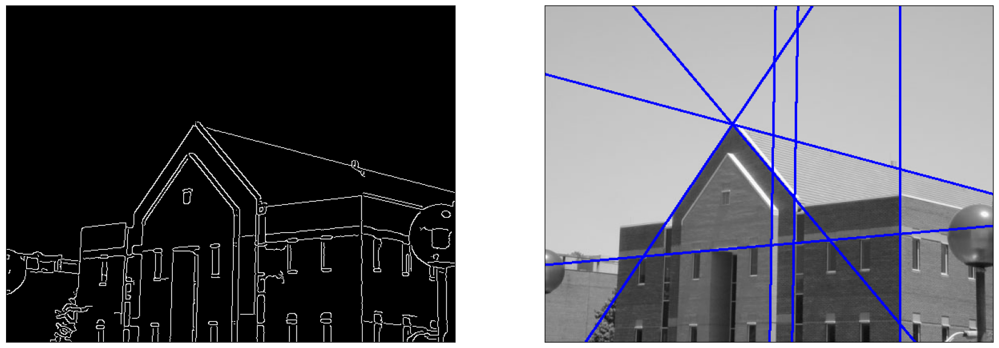

In [24]:
import cv2
import numpy as np
import math
from matplotlib import pyplot as plt

img = cv2.imread(edge_images_path+'building.jpg')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray=img
imgP=img.copy()

gray = cv2.GaussianBlur(img,(7,7),0)
edges = cv2.Canny(gray,1,50,apertureSize=3,L2gradient=True)
lines = cv2.HoughLines(edges,1,np.pi/180,120)

#Draw all the lines
if lines is not None:
    for i in range(0,len(lines)):
        rho = lines[i][0][0]
        theta = lines[i][0][1]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
        pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
        cv2.line(imgP, pt1, pt2, (0,0,255), 2)

plt.figure(figsize=(0.05*img.shape[0],0.05*img.shape[1]))
plt.subplot(121)
plt.imshow(edges,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.subplot(122)
plt.imshow(imgP,cmap='gray'), plt.xticks([]), plt.yticks([])
plt.show()

Unha implementación máis eficiente da Transformada de Liña de Hough é a función **HoughLinesP()**. Devolve os extremos das liñas detectadas (x0,y0,x1,y1). Esta función ten dous parámetros adicionais:

    MinLineLength - Lonxitude mínima da liña. Os segmentos de liña máis curtos ca ela rexéitanse.
    MaxLineGap - Espazo máximo permitido entre puntos da mesma liña para vinculalos.

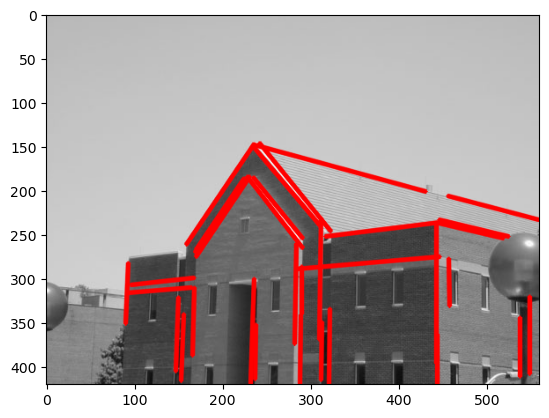

In [25]:
linesP = cv2.HoughLinesP(edges,1,np.pi/180,50,minLineLength=50,maxLineGap=10)

imgP=img.copy()

if linesP is not None:
    for i in range(0, len(linesP)):
        l = linesP[i][0]
        cv2.line(imgP, (l[0], l[1]), (l[2], l[3]), (255,0,0), 3, cv2.LINE_AA)

plt.imshow(imgP)
plt.show()

### Exercicio: Transformada de Hough aplicada a círculos

https://docs.opencv.org/4.x/da/d53/tutorial_py_houghcircles.html

Un círculo represéntase matematicamente polo seu centro *(xcenter,ycenter)* e o seu raio *r*. Como ten 3 parámetros, necesitamos un acumulador 3D para a transformada de Hough. OpenCV ofrece a función **cv2.HoughCircles()**.

**circles= cv2.HoughCircles(image, method, dp, minDist[, param1[, param2[, minRadius[, maxRadius]]]])**

- **image** Imaxe de entrada de 8 bits, monocanal e en escala de grises.
- **circles** Vector de saída dos círculos atopados. Cada vector está codificado como un vector de coma flotante de 3 ou 4 elementos (x,y,radius) ou (x,y,radius,votos).
- **dp** Relación inversa da resolución do acumulador coa resolución da imaxe: se dp=1, o acumulador ten a mesma resolución que a imaxe de entrada; se dp=2, o acumulador ten a metade do ancho e do alto.
- **minDist** Distancia mínima entre os centros dos círculos detectados.
- **param1** Limiar máis alto dos dous pasados ​​ao detector de bordos Canny (o inferior é o dobre de pequeno).
- **param2** Limiar do acumulador para os centros dos círculos na fase de detección.
- **minRadius** Radio mínimo do círculo.
- **maxRadius** Radio máximo do círculo.

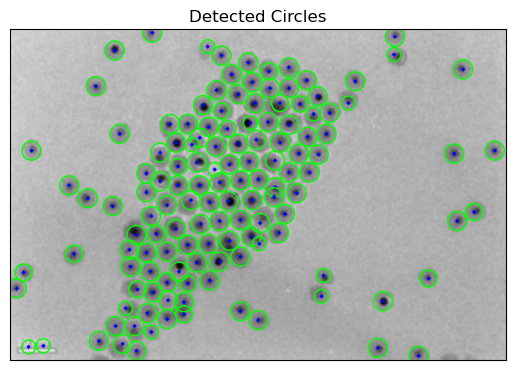

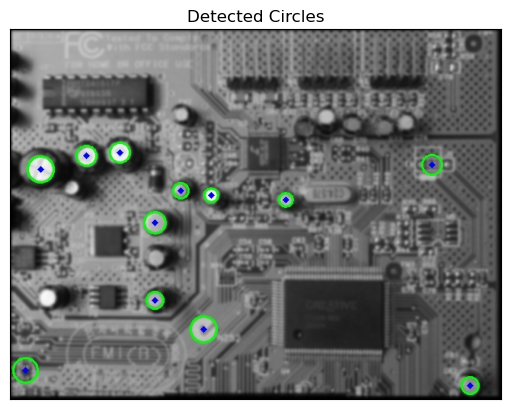

In [26]:
import numpy as np
import cv2 
from matplotlib import pyplot as plt

img = cv2.imread(edge_images_path+'spec2.tif',0)
img = cv2.GaussianBlur(img,(9,9),2)

cimg = cv2.cvtColor(img,cv2.COLOR_GRAY2BGR)


circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,dp=2,minDist=20, param1=40,param2=30,minRadius=10,maxRadius=20)
circles = np.uint16(np.around(circles))

for i in circles[0,:]:
    # draw the outer circle
    cv2.circle(cimg,(i[0],i[1]),i[2],(0,255,0),2)
    # draw the center of the circle
    cv2.circle(cimg,(i[0],i[1]),2,(0,0,255),3)

plt.imshow(cimg)
plt.title('Detected Circles'), plt.xticks([]), plt.yticks([])
plt.show()



img = cv2.imread(edge_images_path+'circuit.jpg',0)
img = cv2.GaussianBlur(img,(9,9),0)

cimg = cv2.cvtColor(img,cv2.COLOR_GRAY2BGR)


circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,dp=1,minDist=10, param1=100,param2=30,minRadius=1,maxRadius=30)
circles = np.uint16(np.around(circles))

for i in circles[0,:]:
    # draw the outer circle
    cv2.circle(cimg,(i[0],i[1]),i[2],(0,255,0),2)
    # draw the center of the circle
    cv2.circle(cimg,(i[0],i[1]),2,(0,0,255),3)

plt.imshow(cimg)
plt.title('Detected Circles'), plt.xticks([]), plt.yticks([])
plt.show()

---
---
# EXERCICIO 2.4 (x.x puntos): Círculos de transformada de Hough

Implementa un programa para a estimación do número de troncos na imaxe timber_logs.png (edge_images_path), segundo o número de seccións circulares. Escolle os parámetros máis convenientes.

---
---

In [33]:
#SOLUCIÓN AQUÍ